# Updated Project TimeSeries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.base import BaseEstimator, RegressorMixin
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import KFold,cross_val_score,learning_curve
from scipy.stats import probplot
from xgboost import XGBRegressor
import optuna
import random

In [2]:
df=pd.read_csv(r"C:\Users\gandj\OneDrive\Desktop\Case_Study\TimeSeries\Revenue\Month_Value_1.csv")
pd.options.display.float_format = '{:.0f}'.format
df.head()

,Period,Revenue,Sales_quantity,Average_cost,The_average_annual_payroll_of_the_region
0,01.01.2015,16010072,12729,1258,30024676
1,01.02.2015,15807587,11636,1359,30024676
2,01.03.2015,22047146,15922,1385,30024676
3,01.04.2015,18814583,15227,1236,30024676
4,01.05.2015,14021480,8620,1627,30024676


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 5 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Period                                    96 non-null     object 
 1   Revenue                                   64 non-null     float64
 2   Sales_quantity                            64 non-null     float64
 3   Average_cost                              64 non-null     float64
 4   The_average_annual_payroll_of_the_region  64 non-null     float64
dtypes: float64(4), object(1)
memory usage: 3.9+ KB


In [4]:
df.isnull().sum()/len(df)*100

Period                                      0
Revenue                                    33
Sales_quantity                             33
Average_cost                               33
The_average_annual_payroll_of_the_region   33
dtype: float64

Here we face the first problem, apart from the period 33 rows contain no data, which makes these rows unusable, so we drop them.

In [5]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64 entries, 0 to 63
Data columns (total 5 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Period                                    64 non-null     object 
 1   Revenue                                   64 non-null     float64
 2   Sales_quantity                            64 non-null     float64
 3   Average_cost                              64 non-null     float64
 4   The_average_annual_payroll_of_the_region  64 non-null     float64
dtypes: float64(4), object(1)
memory usage: 3.0+ KB


In [6]:
min_date=df['Period'].min()
max_date=df['Period'].max()
print(f'The date range is between {min_date} and {max_date}')

The date range is between 01.01.2015 and 01.12.2019


In [7]:
#here we see how many datapoints are avaiable for each year
#each year in the dataset is divided into months, so we make sure that the index sticks to
##the monthly interval we need to adjust it
df['Year']=pd.to_datetime(df['Period']).dt.year
df.groupby(['Year'])['Period'].count()

Year
2015    12
2016    12
2017    12
2018    12
2019    12
2020     4
Name: Period, dtype: int64

In [8]:
#this part is very important, we need to set the freqeuncy of the data, due to the fact that we have 64 months of data, we will set
##the frequency to start of the month
df.index=pd.date_range('2015-01-01', periods=64, freq='MS')
df.drop(['Period'], axis=1, inplace=True)

Next, we want to get an idea how all the features behave. We apply the log-transformation to all features to bring them all on the same scale.

Text(0.5, 1.0, 'All Features brought on The Same Scale')

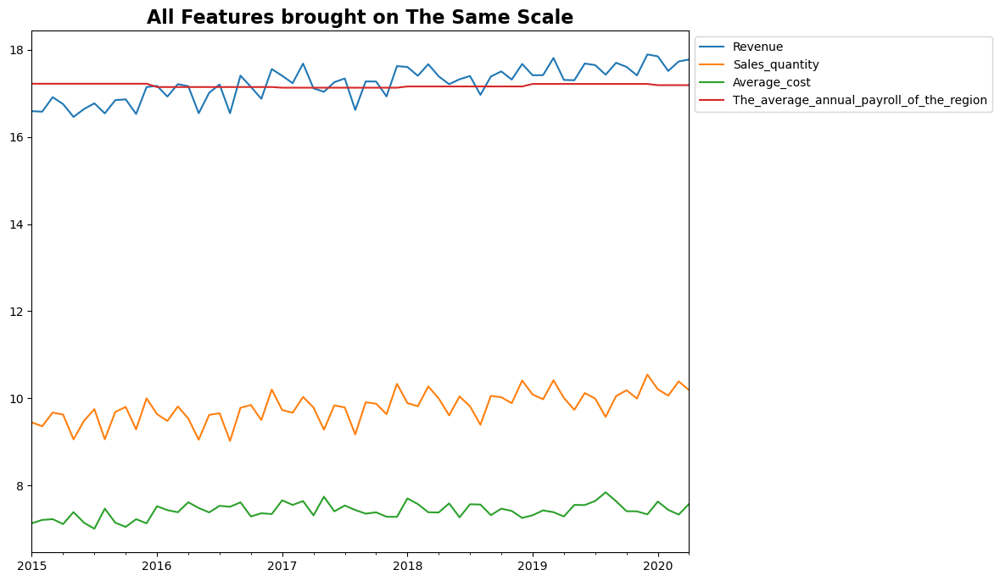

In [9]:
#here I have applied the logarithm to bring the different columns on a same scale
#two aspects that we found
##the average anual payroll and revenue are very close together
##the data looks linear and there might be a season trend observable

plt.figure(figsize=(10,8))
for x in df.iloc[:,:-1].columns:
    df_vis=df.copy()
    df_vis[x]= np.log(df[x])
    df_vis[x].plot(legend=True)
plt.legend(bbox_to_anchor=(1.0,1.0))
plt.title('All Features brought on The Same Scale',size=16,fontweight='bold')

Text(0.5, 1.0, 'Lineplot for Revenue')

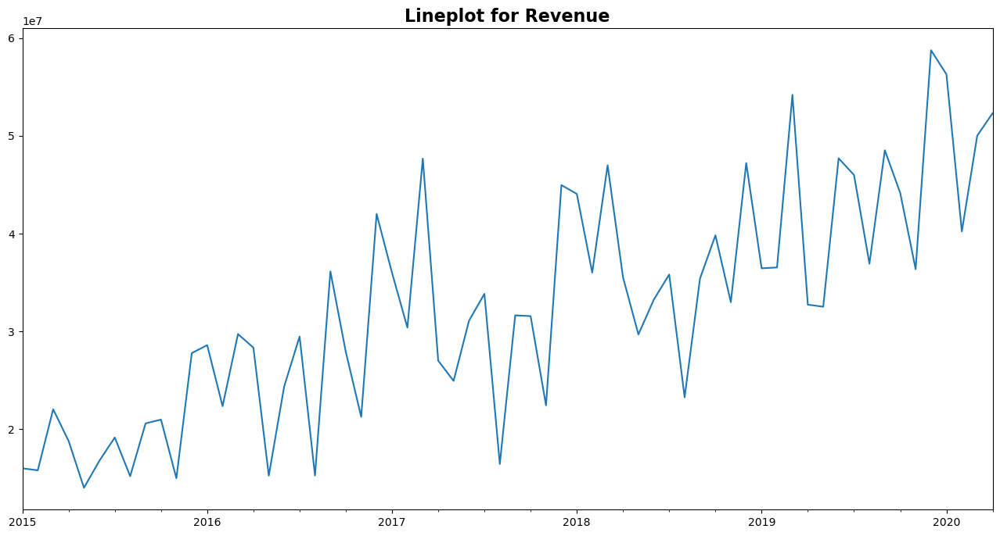

In [10]:
plt.figure(figsize=(16,8))
df['Revenue'].plot()
plt.title('Lineplot for Revenue',size=16,fontweight='bold')

When we look at the graph above, we can see a linear trend, but we are not sure yet, if we can see seasonal trend. That is why we will use the season decompose model to get an idea/confirmation that the data has a linear and/or seasonal trend.

#### Seasonal Decomposition for y Feature

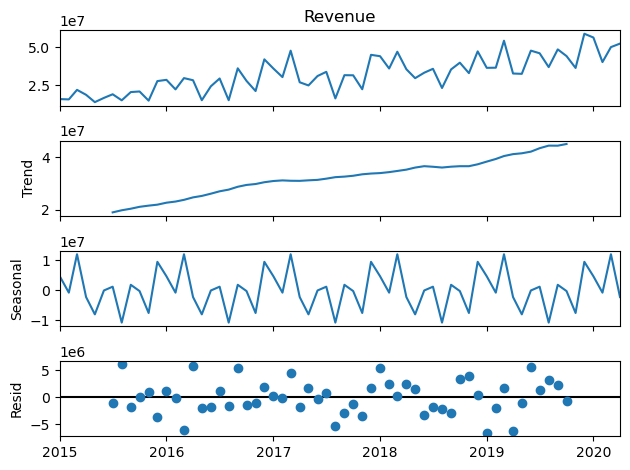

In [11]:
#model='additive'
seasonal=seasonal_decompose(df['Revenue'],model='additive',period=12)
seasonal.plot();

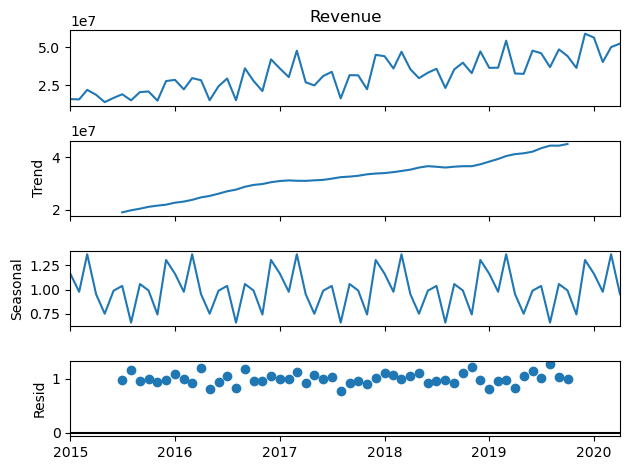

In [12]:
#model='multiplicative'
seasonal=seasonal_decompose(df['Revenue'],model='multiplicative',period=12)
seasonal.plot();

Looking at the two seasonal decomposition plots, we can see that the data fits an additive model. This decision is based on the random distribution of the residuals, which is not given in the multiplicative model, but in the additive model.

In addition, we can confirm that we have a seasonal trend in the data, which is an important piece of information when it comes to choosing the right model for the project. It is common practice to apply the decomposition model only to the training data. In this example, we apply it to the whole dataset because we only have a few data points.

Next, we apply the seasonal decomposition model to all X features.

<Figure size 1000x800 with 0 Axes>

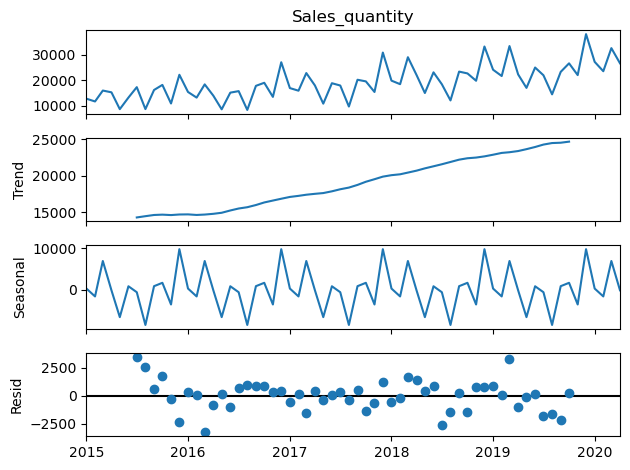

<Figure size 1000x800 with 0 Axes>

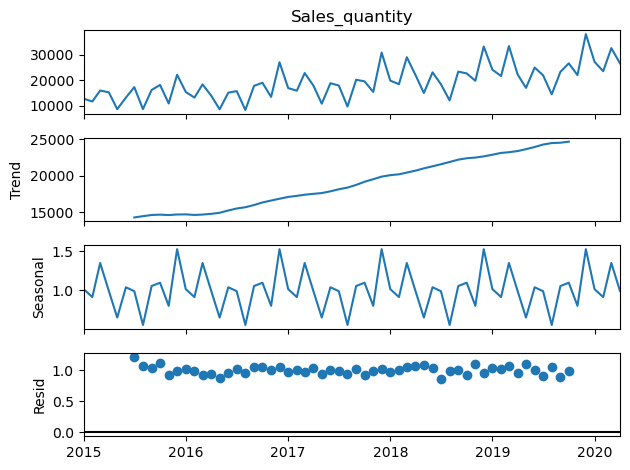

<Figure size 1000x800 with 0 Axes>

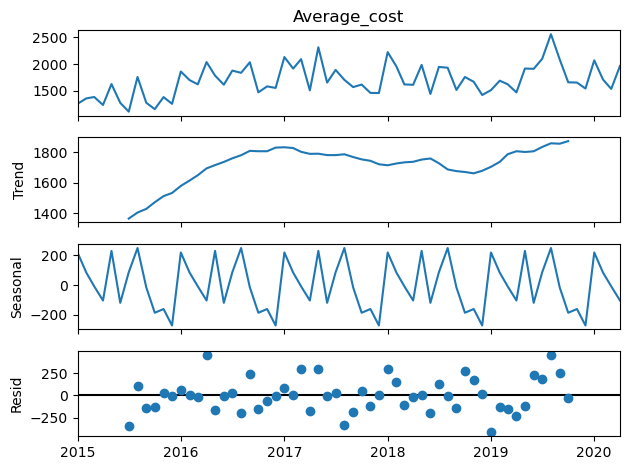

<Figure size 1000x800 with 0 Axes>

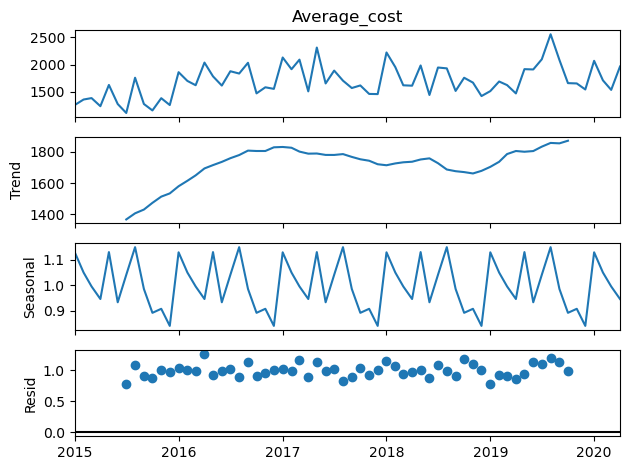

<Figure size 1000x800 with 0 Axes>

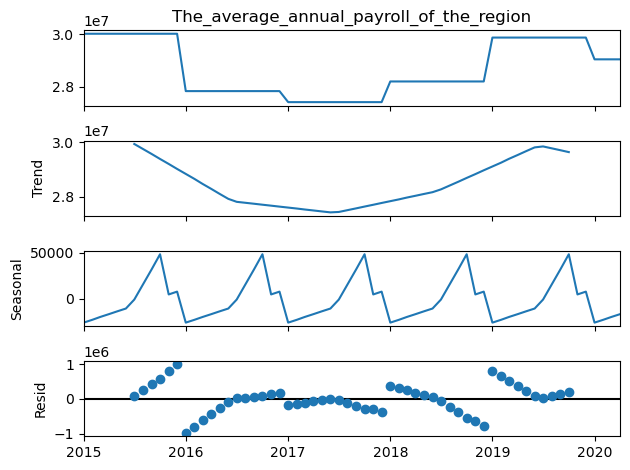

<Figure size 1000x800 with 0 Axes>

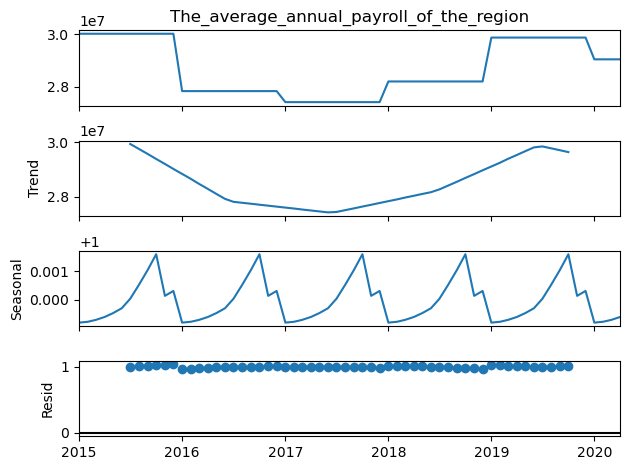

In [13]:
for x in list(df.iloc[:,1:-1].columns):
    for y in ['additive','multiplicative']:
        plt.figure(figsize=(10,8))
        seasonal=seasonal_decompose(df[x],model=y,period=12)
        seasonal.plot();

Looking at the output of the seasonal decomposition gaphs, we can see that only "sales_quantity" is linear. All X features show a seasonal trend and except for "The_average_annual_payroll_of_the_region", all characteristics fit an additive model. For "The_average_annual_payroll_of_the_region", we can see that the data does not fit either approach. This can be seen when we look at the residuals, they do not look random.

In general, we can say that the data fits better to an additive model, which means that we do not have exponential growth. This is important to know if we need to adjust the data, for example if the data is not stationary.

Next, we check all the features for linearity, normal distribution, etc.

### Linearity Check

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\3913784572.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[x],bins='fd')
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\3913784572.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[x],bins='fd')
C:\Users\gandj\AppData\Local\Temp\

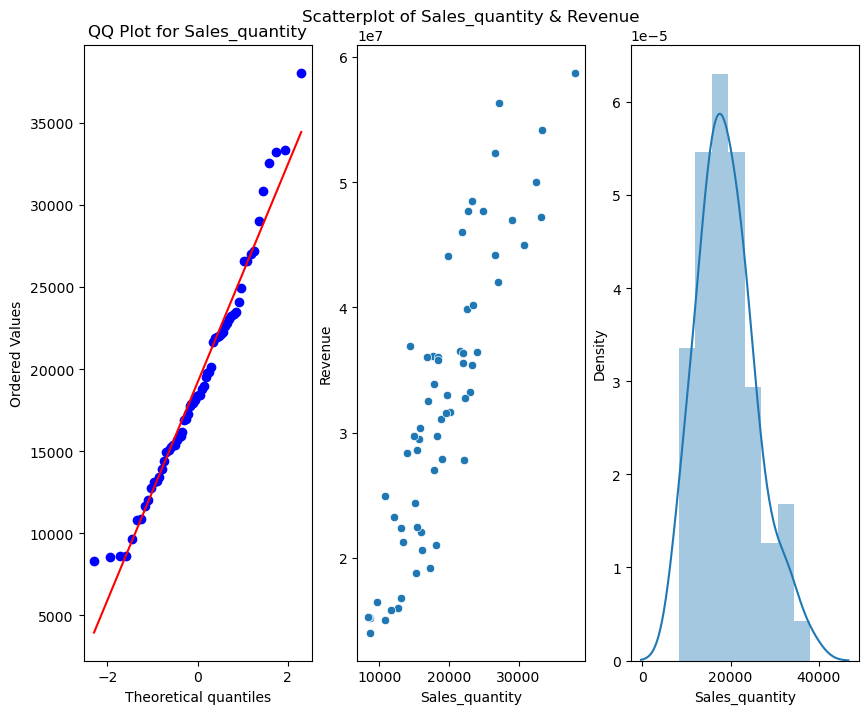

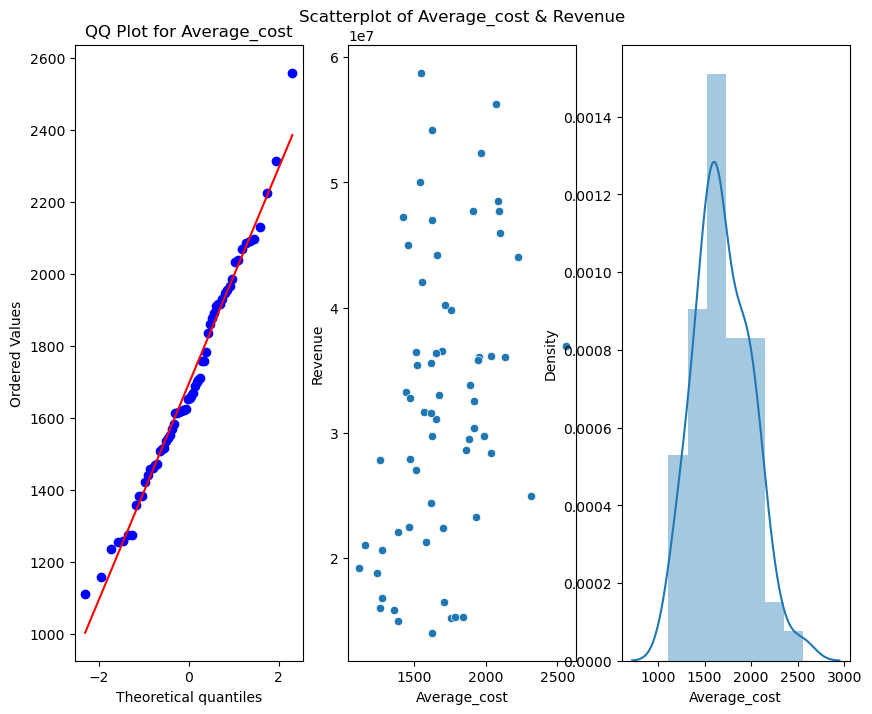

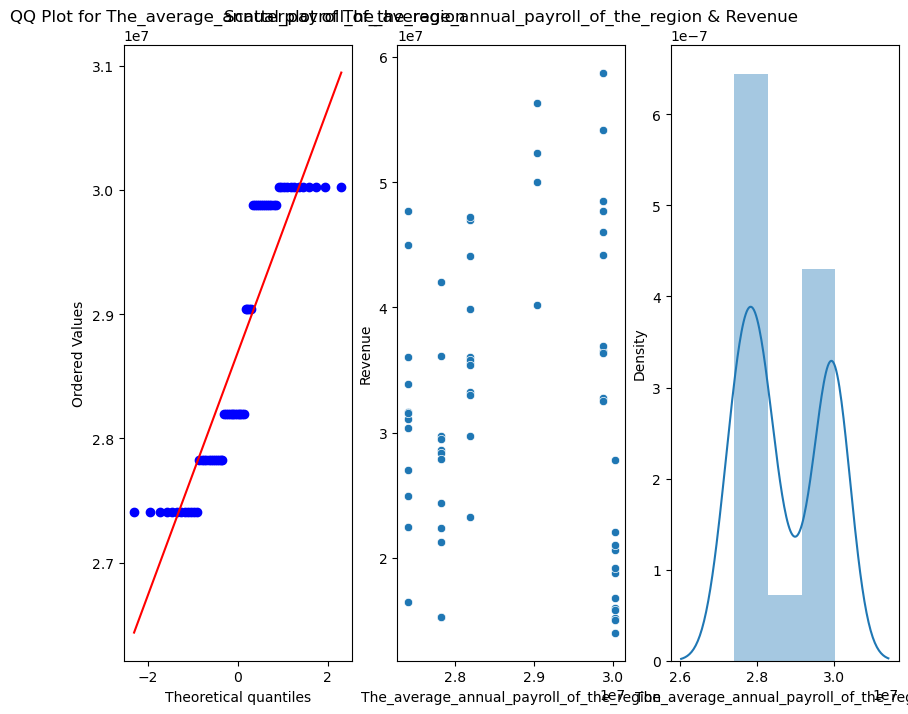

In [14]:
for x in list(df.iloc[:,1:-1].columns):
    plt.figure(figsize=(10,8))
    plt.subplot(1,3,1)
    probplot(df[x],dist='norm',plot=plt)
    plt.title(f'QQ Plot for {x}')

    plt.subplot(1,3,2)
    sns.scatterplot(y=df['Revenue'],x=df[x])
    plt.title(f'Scatterplot of {x} & Revenue')

    plt.subplot(1,3,3)
    sns.distplot(df[x],bins='fd')

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\1170266324.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Revenue'],bins='fd')


<Axes: xlabel='Revenue', ylabel='Density'>

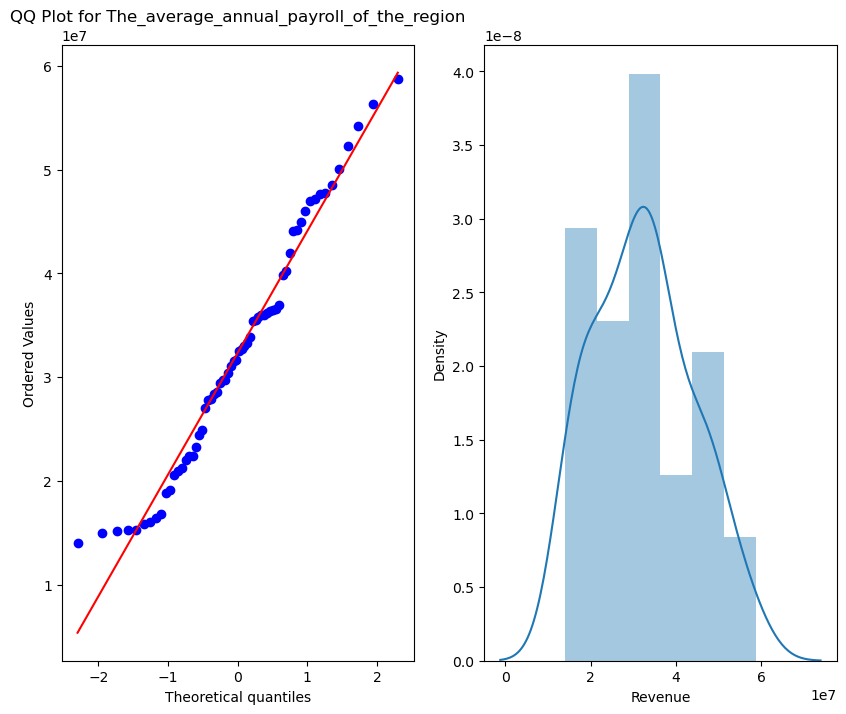

In [15]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
probplot(df['Revenue'],dist='norm',plot=plt)
plt.title(f'QQ Plot for {x}')

plt.subplot(1,2,2)
sns.distplot(df['Revenue'],bins='fd')

The scatterplot indicate that the majority of the features do not have a linear relationship with the y feature.

When it comes to normal distribution, only "The_average_annual_payroll_of_the_region" does not follow a normal distribution, which we can see at the qqplot.

The y feature is normally distributed.

### Feature Selection

First we will check whether the data is stationary or not, we will do this with the AD Fuller Test. Before we do this, we need to split the data into training and test sets. When running the time series it is important to split the data into representative sets. We want to predict revenue for a period of 12 months. After dealing with the missing values, the data set contains 64 data points, 5 years and 4 months. The data set shows a seasonal trend/pattern that occurs once a year, so the test set will not only contain 12 data points, but 16 to ensure that we get the full seasonal trend.

In [16]:
X = df.drop(['Revenue','Year'], axis=1)
y = df['Revenue']

# Split data into train and test sets
X_train = X.iloc[:-16]
X_test = X.iloc[-16:]

y_train = y.iloc[:-16]
y_test = y.iloc[-16:]

In [17]:
for x in list(X_train.columns):
    adf_result=adfuller(X_train[x])
    print(f'p-value of AD Fuller Test for {x}: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')
    print('\n')
adf_result=adfuller(y_train)
print(f'p-value of AD Fuller Test for Revenue: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')

p-value of AD Fuller Test for Sales_quantity: 0.998240; Non-Stationary


p-value of AD Fuller Test for Average_cost: 0.000004; Stationary


p-value of AD Fuller Test for The_average_annual_payroll_of_the_region: 0.392685; Non-Stationary


p-value of AD Fuller Test for Revenue: 0.581080; Non-Stationary


As we can see, only "Average_cost" is stationary, all the other features are not. When we want to use models like SARIMA or SARIMAX, we need to make the data stationary, and that is what we will do.

To check whether the data is stationary or not, we will use the AD Fuller Test.

In [18]:
X = df.drop(['Revenue','Year'], axis=1)
y = df['Revenue']

for v in [3,6,9,12,16]:
    # Split data into train and test sets
    X_train = X.iloc[:-v]
    X_test = X.iloc[-v:]

    y_train = y.iloc[:-v]
    y_test = y.iloc[-v:]

    for x in list(X_train.columns):
        adf_result=adfuller(X_train[x])
        print(f'p-value of AD Fuller Test for {v}-{x}: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')
        print('\n')
        adf_result_diff=adfuller(X_train[x].diff().dropna())
        print(f'p-value of AD Fuller Test for {v}-{x}_diff: {adf_result_diff[1]:.6f}; {"Non-Stationary" if adf_result_diff[1] > 0.05 else "Stationary"}')
        print('\n')
    adf_result=adfuller(y_train)
    print(f'p-value of AD Fuller Test for {v}-Revenue: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')
    print('\n')
    adf_result_diff=adfuller(y_train.diff().dropna())
    print(f'p-value of AD Fuller Test for {v}-Revenue: {adf_result_diff[1]:.6f}; {"Non-Stationary" if adf_result_diff[1] > 0.05 else "Stationary"}')
    print('\n')

p-value of AD Fuller Test for 3-Sales_quantity: 0.998799; Non-Stationary


p-value of AD Fuller Test for 3-Sales_quantity_diff: 0.002910; Stationary


p-value of AD Fuller Test for 3-Average_cost: 0.000003; Stationary


p-value of AD Fuller Test for 3-Average_cost_diff: 0.000002; Stationary


p-value of AD Fuller Test for 3-The_average_annual_payroll_of_the_region: 0.444444; Non-Stationary


p-value of AD Fuller Test for 3-The_average_annual_payroll_of_the_region_diff: 0.000000; Stationary


p-value of AD Fuller Test for 3-Revenue: 0.927112; Non-Stationary


p-value of AD Fuller Test for 3-Revenue: 0.000003; Stationary


p-value of AD Fuller Test for 6-Sales_quantity: 0.998646; Non-Stationary


p-value of AD Fuller Test for 6-Sales_quantity_diff: 0.011764; Stationary


p-value of AD Fuller Test for 6-Average_cost: 0.000005; Stationary


p-value of AD Fuller Test for 6-Average_cost_diff: 0.000000; Stationary


p-value of AD Fuller Test for 6-The_average_annual_payroll_of_the_region: 0.5

Besides "Average_cost" non of the other features are stationary. As we have already stated, the majority of the data indicates that it might be additive, therefore we get the differences between the different data points and check again.

Another aspect we can observe is that no matter how small/large the test set is, its characteristic remains.

In [19]:
for x in list(X_train.iloc[:,[0,2]].columns):
    adf_result=adfuller(X_train[x].diff().dropna())
    print(f'p-value of AD Fuller Test for {x}: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')
    print('\n')
adf_result=adfuller(y_train.diff().dropna())
print(f'p-value of AD Fuller Test for Revenue: {adf_result[1]:.6f}; {"Non-Stationary" if adf_result[1] > 0.05 else "Stationary"}')

p-value of AD Fuller Test for Sales_quantity: 0.000000; Stationary


p-value of AD Fuller Test for The_average_annual_payroll_of_the_region: 0.000000; Stationary


p-value of AD Fuller Test for Revenue: 0.000033; Stationary


In [20]:
#differencing X_train
for x in list(X_train.iloc[:,[0,2]].columns):
    X_train[x]=X_train[x].diff().dropna()
X_train.dropna(inplace=True)

#differencing y_train
y_train=y_train.diff().dropna()

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2769418011.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[x]=X_train[x].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2769418011.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.dropna(inplace=True)


C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\626417221.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\626417221.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\626417221.py:28: UserWarning: 

`distplot` is a 

<Axes: xlabel='Revenue', ylabel='Density'>

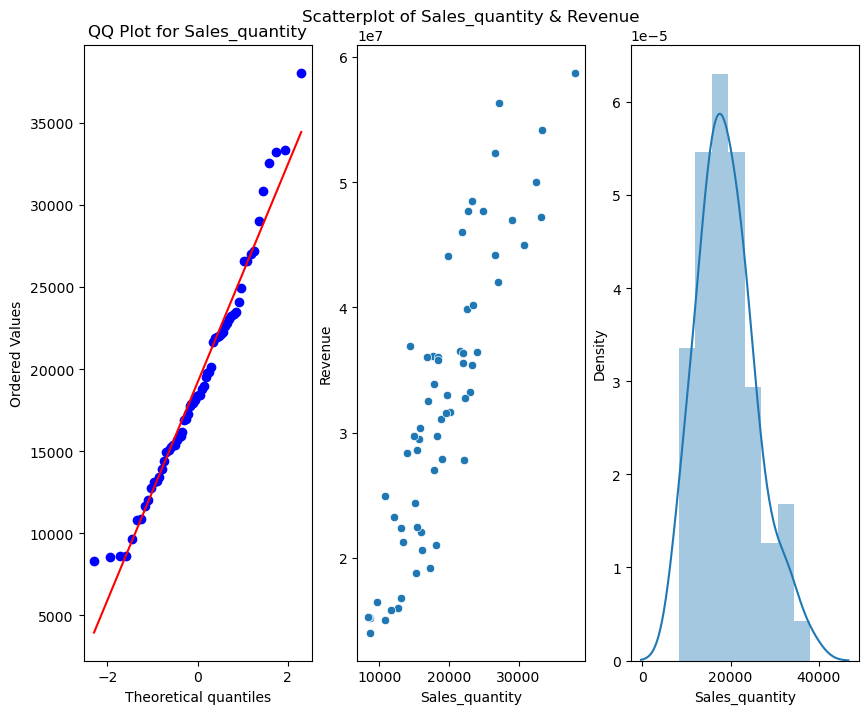

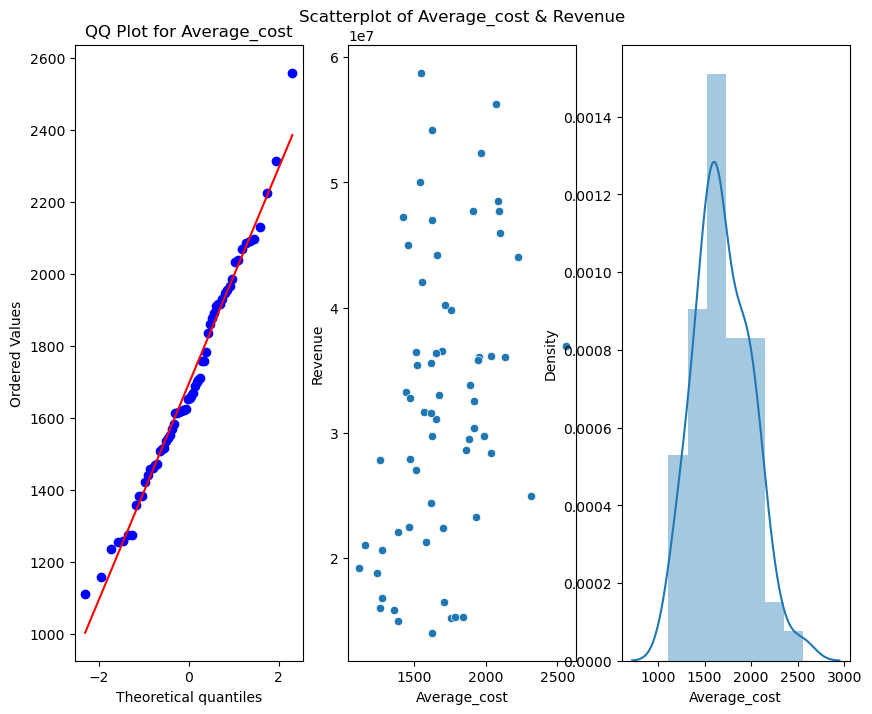

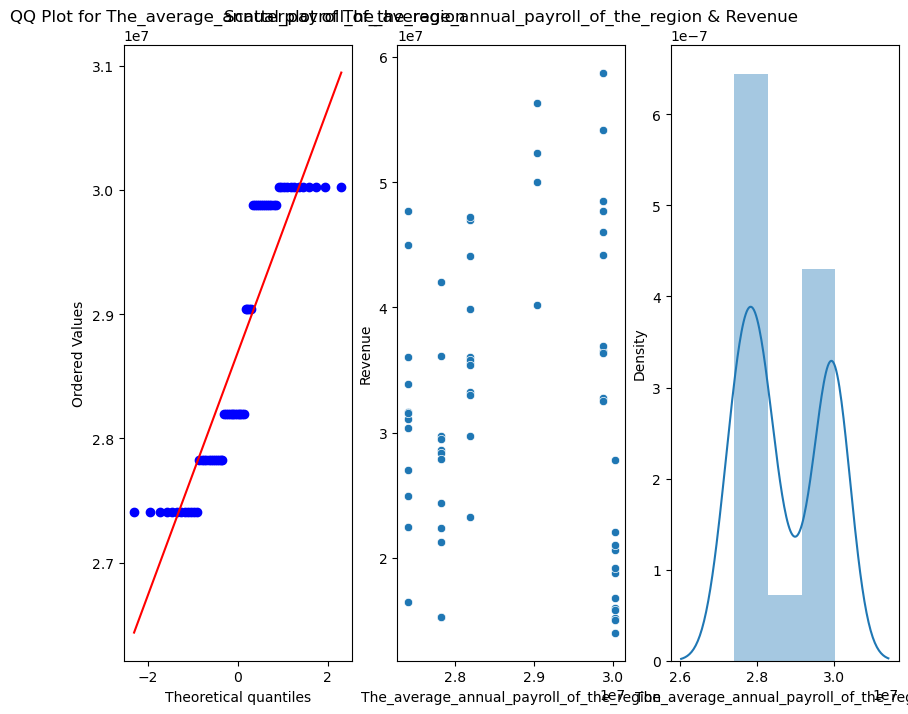

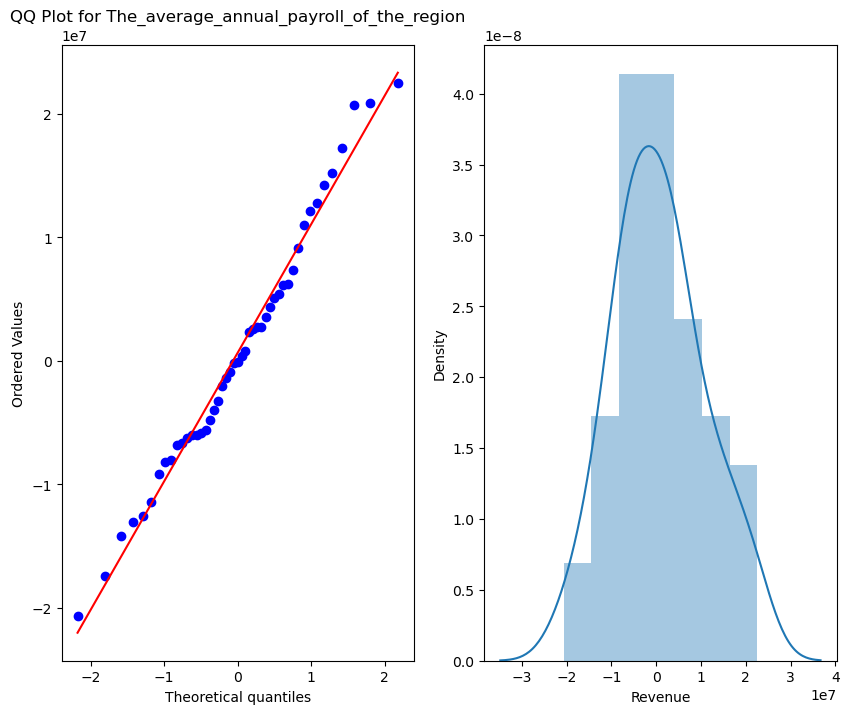

In [21]:
X = df.drop(['Revenue','Year'], axis=1)
y = df['Revenue']

X_train=X[:-16]
X_test=X[-16:]

y_train=y[:-16]
y_test=y[-16:]

X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
y_train=y_train.diff().dropna()

X_train_of=X_train.dropna()
X_test_of=X_test

for x in list(X_train_of.columns):
    plt.figure(figsize=(10,8))
    plt.subplot(1,3,1)
    probplot(df[x],dist='norm',plot=plt)
    plt.title(f'QQ Plot for {x}')

    plt.subplot(1,3,2)
    sns.scatterplot(y=df['Revenue'],x=df[x])
    plt.title(f'Scatterplot of {x} & Revenue')

    plt.subplot(1,3,3)
    sns.distplot(df[x],bins='fd')

plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
probplot(y_train,dist='norm',plot=plt)
plt.title(f'QQ Plot for {x}')

plt.subplot(1,2,2)
sns.distplot(y_train,bins='fd')

The data is now stationary, we will apply that to the data set and we will finally check for autocorrelation. It is also important to note that even after making the data stationary, we are still dealing with the same characteristics (relationship with y, distribution, etc.).

ACF and PACF for feature: Sales_quantity


<Figure size 1200x600 with 0 Axes>

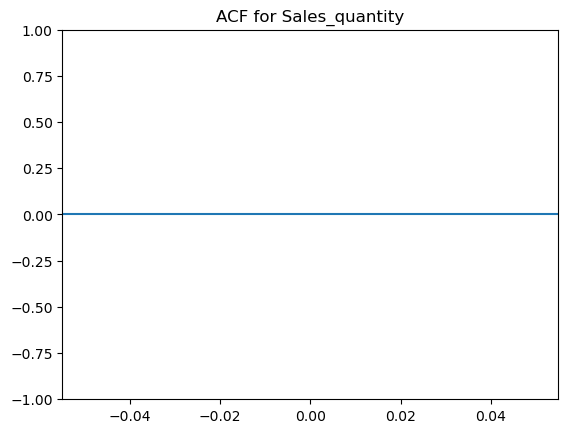

<Figure size 1200x600 with 0 Axes>

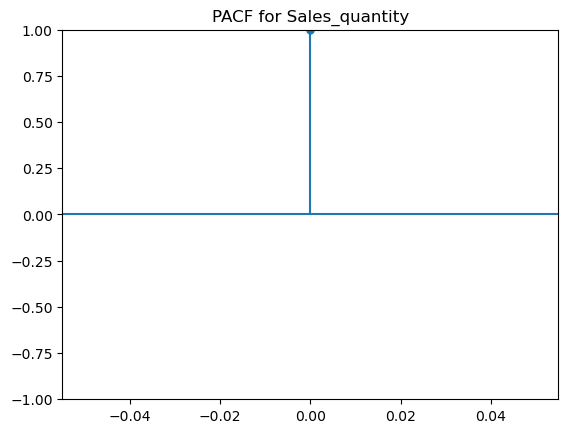

ACF and PACF for feature: Average_cost


<Figure size 1200x600 with 0 Axes>

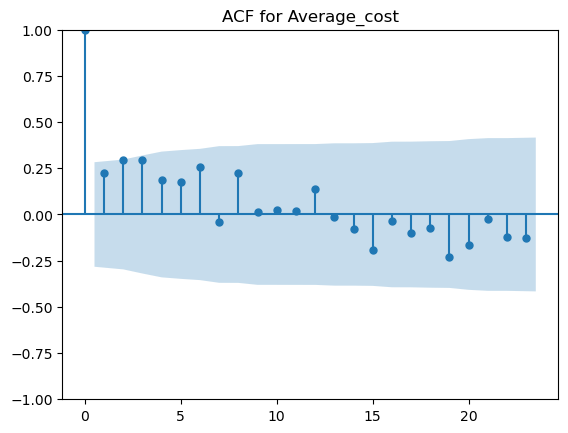

<Figure size 1200x600 with 0 Axes>

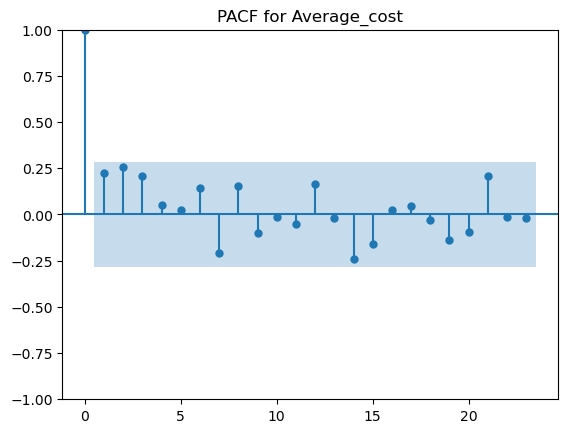

ACF and PACF for feature: The_average_annual_payroll_of_the_region


<Figure size 1200x600 with 0 Axes>

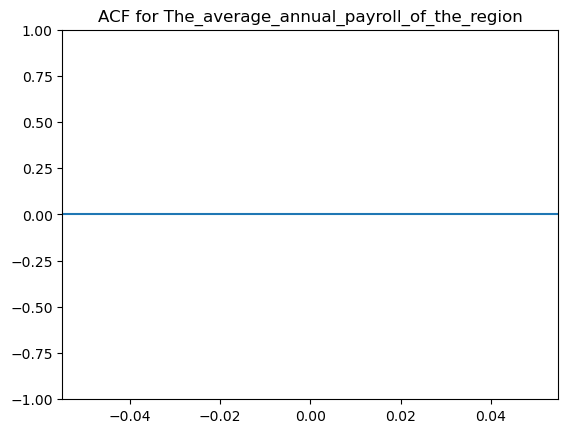

<Figure size 1200x600 with 0 Axes>

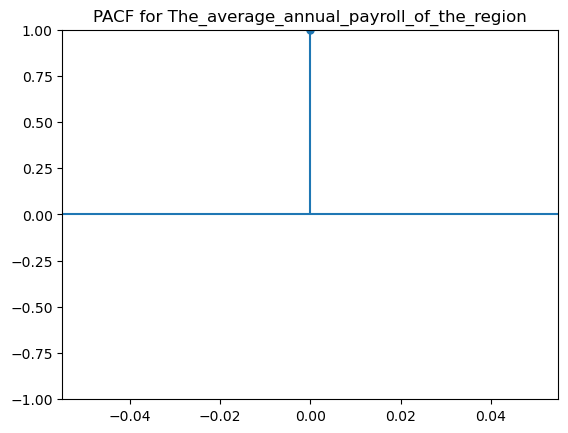

In [22]:
for x in X_train.columns:
    print(f"ACF and PACF for feature: {x}")

    # Plot ACF for each feature
    plt.figure(figsize=(12, 6))
    plot_acf(X_train[x], lags=23)
    plt.title(f"ACF for {x}")
    plt.show()

    # Plot PACF for each feature
    plt.figure(figsize=(12, 6))
    plot_pacf(X_train[x], lags=23)
    plt.title(f"PACF for {x}")
    plt.show()

The ACF plot shows the correlation of the series with its lagged versions; if a lag is outside the confidence intervals, then that particular lag is autocorrelated.

The PACF shows the correlation between a time series and its lagged versions after removing the effect of shorter lags. These graphs help us to set the best parameter for models such as ARIMAX and SARIMAX.
Just to confirm the autocorrelation, we will perform the Ljung box test.

In [23]:
for x in list(X_train.columns):
    for l in [1,10,15,20,30,31]:
        acorr_ljungbox_result = acorr_ljungbox(X_train[x], lags=l, return_df=True)
        print(f'Column {x} p-value for lag {l}: {acorr_ljungbox_result["lb_pvalue"].iloc[0]:.6f}; {"Dealing with Autocorrelation" if acorr_ljungbox_result["lb_pvalue"].iloc[0] < 0.05 else "Not Dealing with Autocorrelation"}')
        print('\n')
    print('\n')

Column Sales_quantity p-value for lag 1: nan; Not Dealing with Autocorrelation


Column Sales_quantity p-value for lag 10: nan; Not Dealing with Autocorrelation


Column Sales_quantity p-value for lag 15: nan; Not Dealing with Autocorrelation


Column Sales_quantity p-value for lag 20: nan; Not Dealing with Autocorrelation


Column Sales_quantity p-value for lag 30: nan; Not Dealing with Autocorrelation


Column Sales_quantity p-value for lag 31: nan; Not Dealing with Autocorrelation




Column Average_cost p-value for lag 1: 0.104810; Not Dealing with Autocorrelation


Column Average_cost p-value for lag 10: 0.104810; Not Dealing with Autocorrelation


Column Average_cost p-value for lag 15: 0.104810; Not Dealing with Autocorrelation


Column Average_cost p-value for lag 20: 0.104810; Not Dealing with Autocorrelation


Column Average_cost p-value for lag 30: 0.104810; Not Dealing with Autocorrelation


Column Average_cost p-value for lag 31: 0.104810; Not Dealing with Autocorrelation


As we can see, the majorty of the features do not deal with autocorrelation. This is a important aspect when it comes to find the right parameters for models like ARIMA, SARIMA etc.

Before we decide which models we will use, we will determine which features are important for a TimeSeries. To do that, we will use the Granger Causality Test and Ljung-Box Test.

The Granger Causality Test allows us to check wheter one feature can predict a target variable/y feature. This is done by checking if the past values contributed to the y feature. In summary, the Granger Causality Test measures the predictive value of a feature.

The Ljung-Box Test identifies non-random features, which might give use important insight.

In [24]:
feature_select_X=X_train.reset_index()
feature_select_y=y_train.reset_index()
feature_select_df=pd.merge(feature_select_X,feature_select_y,how='inner',on='index')
feature_select_df.set_index('index',inplace=True)
# List of features to test for Granger causality
features = list(feature_select_df.iloc[:,:-1].columns)

for feature in features:
    print(f"Testing Granger causality for {feature} -> target")

    # Ensure DataFrame with only the feature and target
    feature_target_df = feature_select_df[[feature, 'Revenue']]

    # Run Granger causality test
    granger_results = grangercausalitytests(feature_target_df, 10)

    # Check p-values for each lag
    for lag, result in granger_results.items():
        p_value = result[0]['ssr_ftest'][1]
        if p_value < 0.05:
            print(f"{feature} is Granger-causal to the target at lag {lag} (p={p_value:.4f})")
            print('\n')
        else:
            print(f"No Granger causality for {feature} at lag {lag}")
            print('\n')

# Ljung-Box Test for each feature
for feature in features:
    print(f"Testing Ljung-Box for {feature}")
    ljung_box_results = acorr_ljungbox(feature_select_df[feature], lags=[10], return_df=True)
    print(f'p_value: {ljung_box_results["lb_pvalue"]}')


Testing Granger causality for Sales_quantity -> target

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3541  , p=0.1323  , df_denom=43, df_num=1
ssr based chi2 test:   chi2=2.5183  , p=0.1125  , df=1
likelihood ratio test: chi2=2.4518  , p=0.1174  , df=1
parameter F test:         F=2.3541  , p=0.1323  , df_denom=43, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0943  , p=0.9102  , df_denom=40, df_num=2
ssr based chi2 test:   chi2=0.2122  , p=0.8993  , df=2
likelihood ratio test: chi2=0.2117  , p=0.8995  , df=2
parameter F test:         F=0.0943  , p=0.9102  , df_denom=40, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4859  , p=0.6941  , df_denom=37, df_num=3
ssr based chi2 test:   chi2=1.7335  , p=0.6295  , df=3
likelihood ratio test: chi2=1.7002  , p=0.6369  , df=3
parameter F test:         F=0.4859  , p=0.6941  , df_denom=37, df_num=3

Granger Causality
number of lags (no zero) 4

After running the tests, we came to the conclusion to use the feature sales_quantity and average_cost. These were the only features that showed statistical significance in the Granger causality test and the Ljung box test.

Now that we know how many features we can use, we can decide which models to use.
We have two X features and the X and y show a seasonal trend. This opens up the possibility of using a SARIMAX model.

### SARIMAX

As stated, we will perform hyperparameter tuning using Optuna. Specifically, we will use a randomised search combined with time series cross-validation.

The first experiment will be performed using only the statistically significant feature(s). We will then run the model with all available features. In addition, we will scale the X features to see if our SARIMAX model performs better.

Before we proceed, let's have a quick look at how cross-validation works for time series data. We use cross-validation to better understand how well a model performs when exposed to different subsets of the data. For time series prediction, we use TimeSeriesSplit(), which creates sequential training and validation sets that respect the temporal order of the data, ensuring a proper evaluation of the model's predictive performance.

The following example illustrates how time series cross-validation works in combination with different training sizes.

In [25]:
X = df.drop(['Revenue','Year'], axis=1)
y = df['Revenue']

#different prediction timeframes
for pred_value in [3,6,9,12,16]:
    X_train=X[:-pred_value]
    X_test=X[-pred_value:]

    y_train=y[:-pred_value]
    y_test=y[-pred_value:]

    X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
    y_train=y_train.diff().dropna()

    X_train_of=X_train[['Sales_quantity','Average_cost']].dropna()
    X_test_of=X_test[['Sales_quantity','Average_cost']]

    print(f'Total Lenght of Train: {len(X_train_of)}')

    tscv = TimeSeriesSplit(n_splits=5)

    random.seed(101)
    np.random.seed(101)

    #initialize lists to store the results & determining the training size range
    train_sizes = np.linspace(0.5,1.0,5)
    train_length = []
    test_length = []

    for train_size in train_sizes:
        #loop through different training set sizes
        #get the subset of the data based on the train size
        X_train_subset = X_train_of.iloc[:int(train_size * len(X_train_of))]
        y_train_subset = y_train.iloc[:int(train_size * len(y_train))]

        print(f'Train length after size adjust: {len(X_train_subset)}')

        for train_index, test_index in tscv.split(X_train_subset):
            # Slicing the X and y features with the indexes
            X_train_split, X_test_split = X_train_subset.iloc[train_index], X_train_subset.iloc[test_index]
            y_train_split, y_test_split = y_train_subset.iloc[train_index], y_train_subset.iloc[test_index]
            try:
                train_length.append(len(X_train_split))
                test_length.append(len(X_test_split))
            except:
                0
print(train_length)
print(test_length)

Total Lenght of Train: 60
Train length after size adjust: 30
Train length after size adjust: 37
Train length after size adjust: 45
Train length after size adjust: 52
Train length after size adjust: 60
Total Lenght of Train: 57
Train length after size adjust: 28
Train length after size adjust: 35
Train length after size adjust: 42
Train length after size adjust: 49
Train length after size adjust: 57
Total Lenght of Train: 54
Train length after size adjust: 27
Train length after size adjust: 33
Train length after size adjust: 40
Train length after size adjust: 47
Train length after size adjust: 54
Total Lenght of Train: 51
Train length after size adjust: 25
Train length after size adjust: 31
Train length after size adjust: 38
Train length after size adjust: 44
Train length after size adjust: 51
Total Lenght of Train: 47
Train length after size adjust: 23
Train length after size adjust: 29
Train length after size adjust: 35
Train length after size adjust: 41
Train length after size adjust

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\175709498.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\175709498.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\175709498.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

Before we start with the first model, we must point out that we try different prediction windows for the SARIMAX model to see which one suits the model best.

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\675991479.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
[I 2025-02-07 23:54:32,341] A new study created in memory with name: no-name-d972e323-2d4e-4e21-b842-451bcf59d2d8
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtyp

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Best Hyperparameters for 3: {'p': 2, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}
Best score for {'p': 2, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}: 5545782.346459728


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to 

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimizat

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Best Hyperparameters for 6: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 2, 'disp_': True}
Best score for {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 2, 'disp_': True}: 5942901.236283195


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\s

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Li

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functi

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-07 23:58:51,950] Trial 51 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 35 with value: 5623467.376755538.


Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the r

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Best Hyperparameters for 9: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5623467.376755538


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the 

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2025-02-08 00:00:07,737] Trial 38 finished with value: 10584019.857082492 and parameters: {'p': 0, 'd': 1, 'q': 3, 'P': 1, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 18 with value: 5409840.49277083.
C:\Users\gandj\anaconda3\Lib\site-

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Li

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functi

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Best Hyperparameters for 12: {'p': 2, 'd': 0, 'q': 3, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 3, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}: 5409840.49277083


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mea

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to 

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functio

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to 

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2025-02-08 00:01:36,950] Trial 35 finished with value: 7861247.935063133 and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 5 with value: 5759295.700461871.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gan

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2025-02-08 00:01:38,657] Trial 38 finished with value: 8727499.06378258 and parameters: {'p': 0, 'd': 1, 'q': 3, 'P': 1, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 5 with value: 5759295.700461871.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Li

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functi

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functio

Best Hyperparameters for 16: {'p': 0, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}
Best score for {'p': 0, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}: 5759295.700461871


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

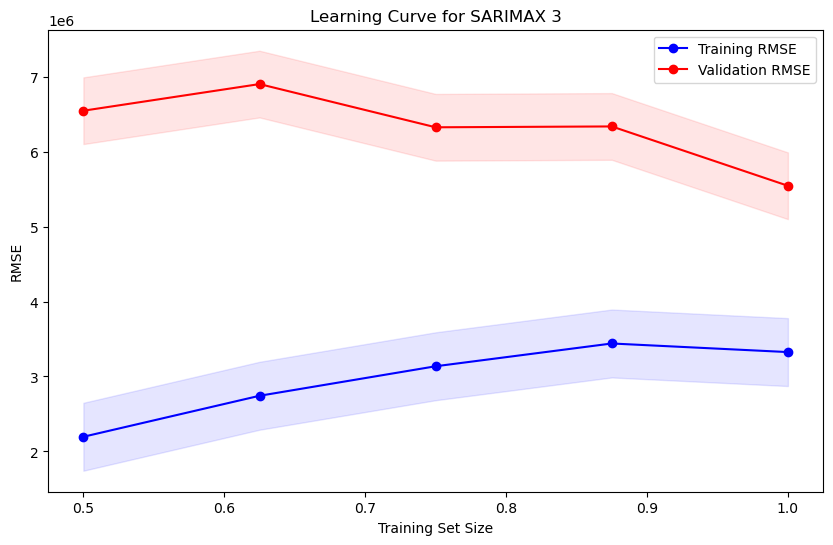

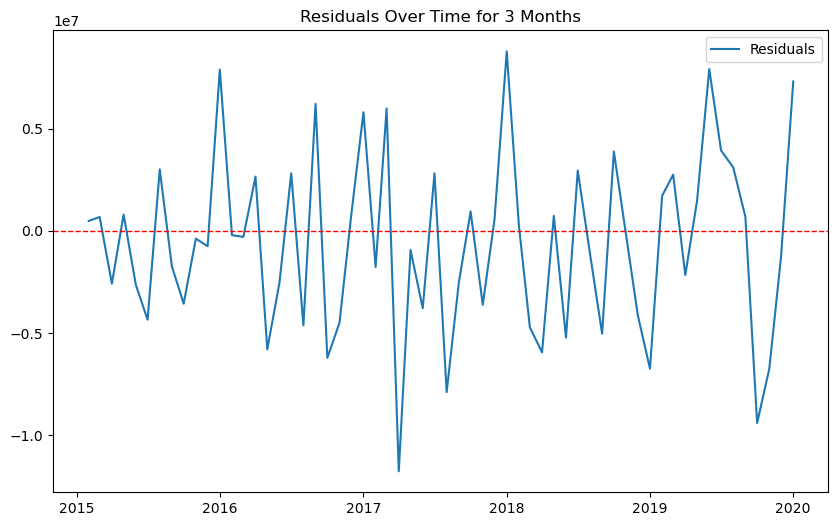

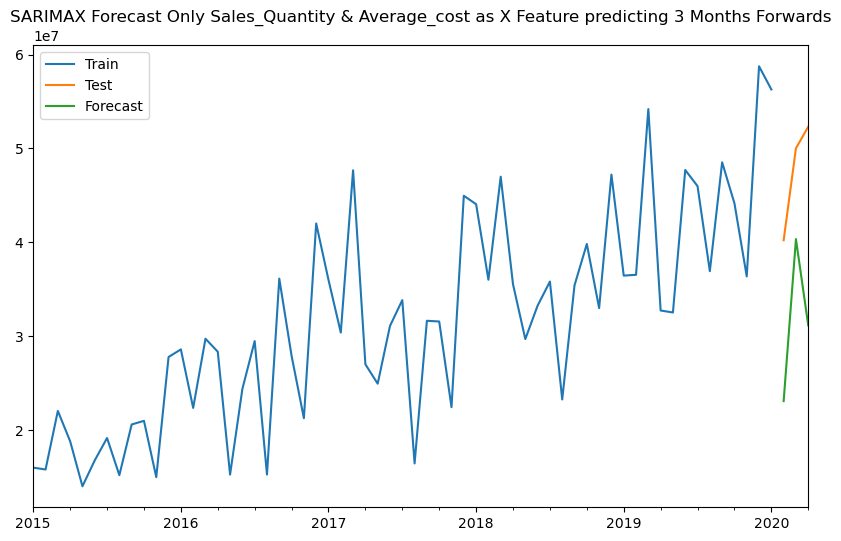

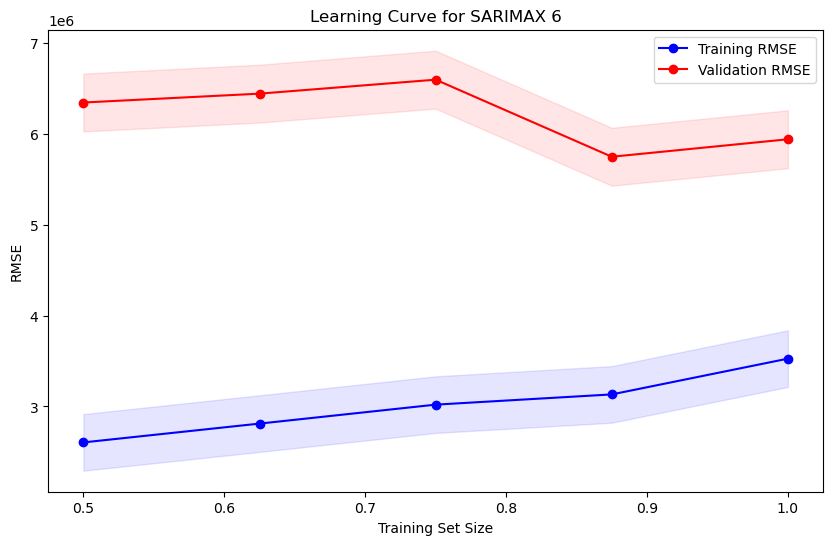

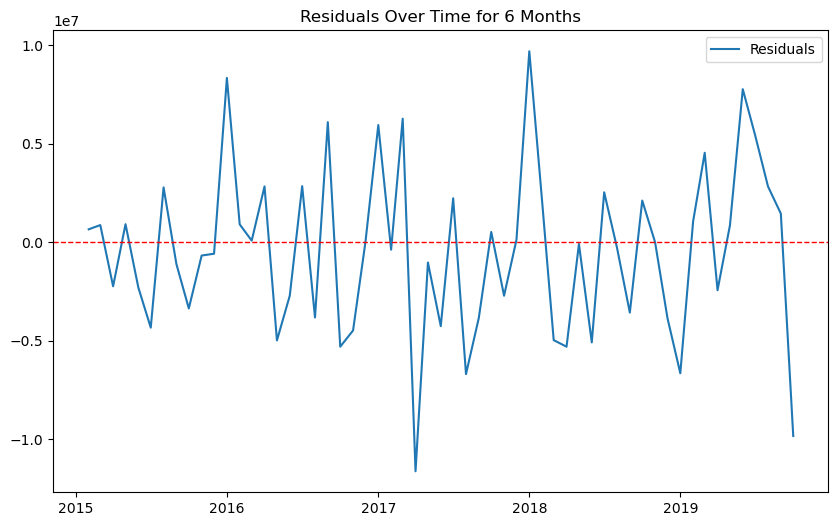

...

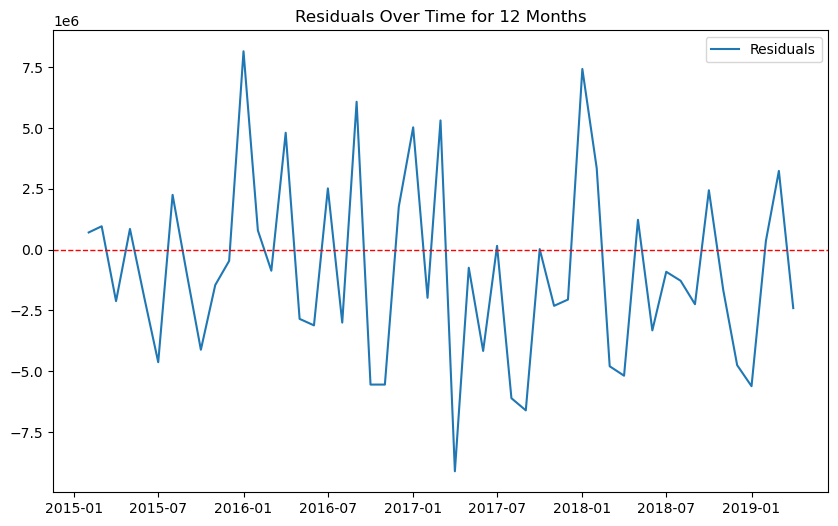

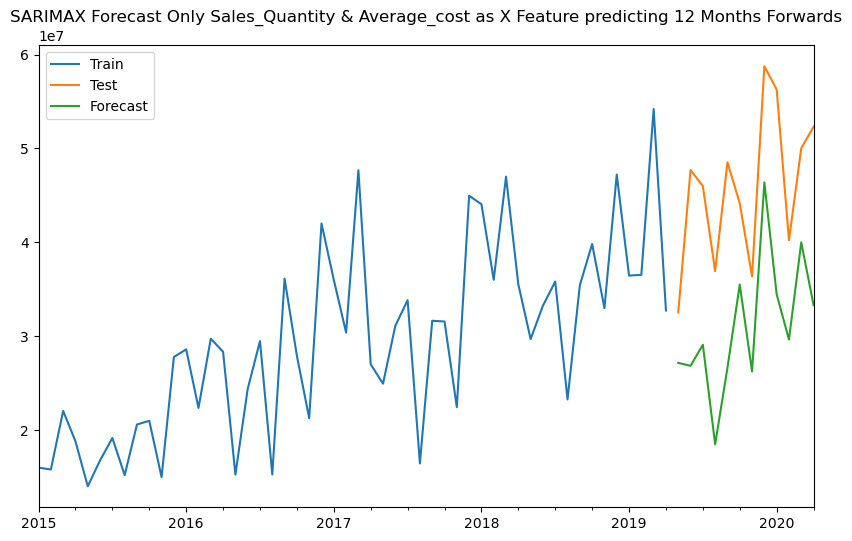

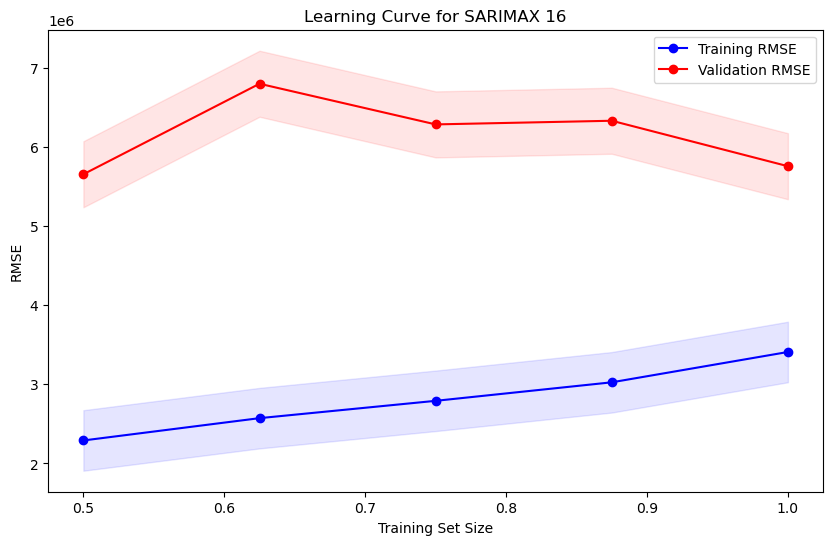

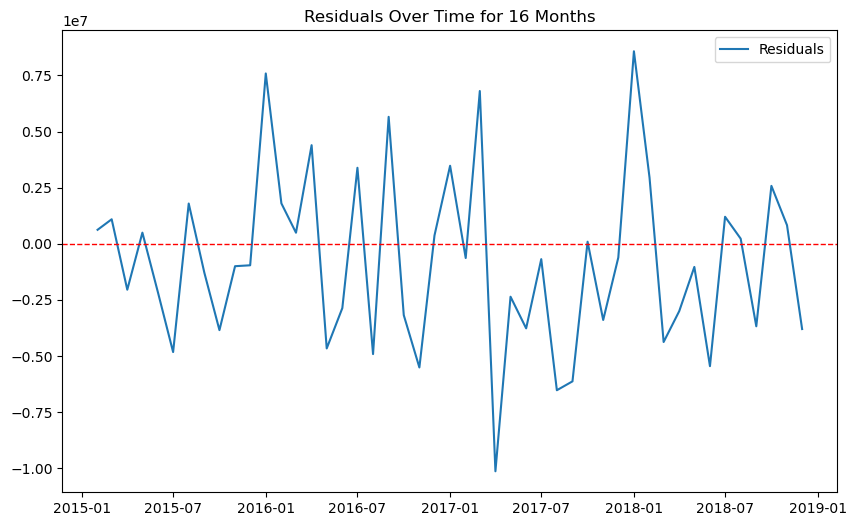

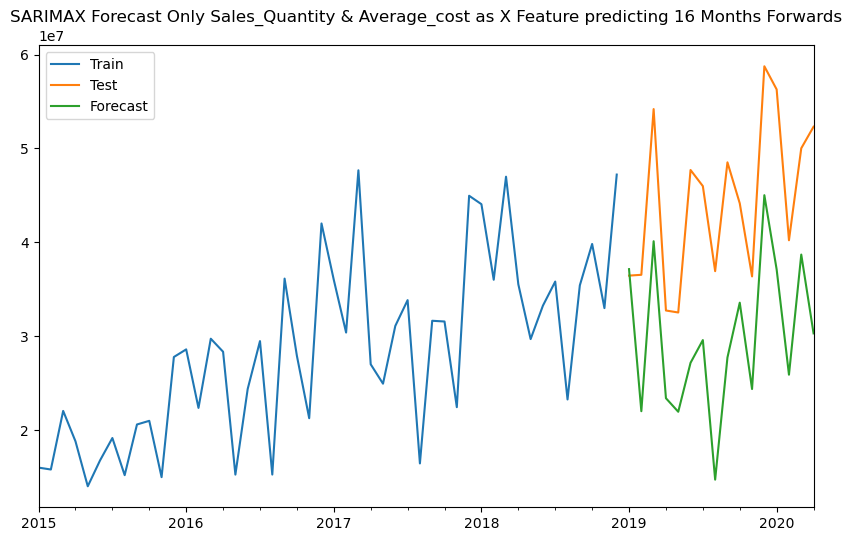

In [26]:
random.seed(101)
np.random.seed(101)

X = df.drop(['Revenue','Year'], axis=1).copy()
y = df['Revenue'].copy()

for pred_value in [3,6,9,12,16]:
    X_train=X[:-pred_value]
    X_test=X[-pred_value:]

    y_train=y[:-pred_value]
    y_test=y[-pred_value:]

    X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
    y_train=y_train.diff().dropna()

    X_train_of=X_train[['Sales_quantity','Average_cost']].dropna()
    X_test_of=X_test[['Sales_quantity','Average_cost']]

    def objective(trial):
        p = trial.suggest_int('p', 0, 3)
        d = trial.suggest_int('d', 0, 2)
        q = trial.suggest_int('q', 0, 3)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        disp_=trial.suggest_categorical('disp_',[True,False])

        tscv = TimeSeriesSplit(n_splits=5)
        rmse_list = []

        for train_index, test_index in tscv.split(X_train_of):
            #slicing the X and y features with the indexies
            X_train_split, X_test_split = X_train_of.iloc[train_index], X_train_of.iloc[test_index]
            y_train_split, y_test_split = y_train.iloc[train_index], y_train.iloc[test_index]

            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split, order=(p, d, q), seasonal_order=(P, D, Q, 12))
                results = sarima.fit(disp=disp_)
                forecast = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                rmse = mean_squared_error(y_test_split, forecast, squared=False)
                rmse_list.append(rmse)
            except Exception as e:
                print(f"Error during fitting: {e}")
                return np.inf

        return np.mean(rmse_list)

    rand_samp=optuna.samplers.RandomSampler(seed=101)
    study=optuna.create_study(direction='minimize',sampler=rand_samp)
    study.optimize(objective,n_trials=60)
    best_params=study.best_params
    best_score=study.best_trial.value
    print(f"Best Hyperparameters for {pred_value}: {best_params}")
    print(f'Best score for {best_params}: {best_score}')

    # Define training sizes
    tscv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store the results
    train_sizes = np.linspace(0.5, 1.0, 5)
    train_scores = []
    test_scores = []

    # Loop through different training set sizes
    for train_size in train_sizes:
        # Get the subset of the data based on the train size
        X_train_subset = X_train_of.iloc[:int(train_size * len(X_train_of))]
        y_train_subset = y_train.iloc[:int(train_size * len(y_train))]

        # Perform cross-validation
        rmse_train = []
        rmse_test = []

        for train_index, test_index in tscv.split(X_train_subset):
            # Slicing the X and y features with the indexes
            X_train_split, X_test_split = X_train_subset.iloc[train_index], X_train_subset.iloc[test_index]
            y_train_split, y_test_split = y_train_subset.iloc[train_index], y_train_subset.iloc[test_index]

            if len(X_train_split) == 0 or len(y_train_split) == 0:
                continue

            # Fit SARIMAX model
            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split,
                                 order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
                                seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'],12))
                results = sarima.fit(disp=study.best_trial.params['disp_'])

                # Predict on train and test sets
                forecast_train = results.predict(start=0, end=len(y_train_split)-1, exog=X_train_split)
                forecast_test = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                # Calculate RMSE for train and test
                rmse_train.append(mean_squared_error(y_train_split, forecast_train, squared=False))
                rmse_test.append(mean_squared_error(y_test_split, forecast_test, squared=False))
            except Exception as e:
                print(f"Error during fitting: {e}")
                rmse_train.append(np.nan)
                rmse_test.append(np.nan)

        # Calculate mean RMSE for train and test for this train size
        train_scores.append(np.mean(rmse_train))
        test_scores.append(np.mean(rmse_test))

    # Convert to numpy arrays for plotting
    train_scores = np.array(train_scores)
    test_scores = np.array(test_scores)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores, 'o-', label='Training RMSE', color='blue')
    plt.plot(train_sizes, test_scores, 'o-', label='Validation RMSE', color='red')
    plt.fill_between(train_sizes, train_scores - np.std(train_scores), train_scores + np.std(train_scores), alpha=0.1, color='blue')
    plt.fill_between(train_sizes, test_scores - np.std(test_scores), test_scores + np.std(test_scores), alpha=0.1, color='red')
    plt.title(f'Learning Curve for SARIMAX {pred_value}')
    plt.xlabel('Training Set Size')
    plt.ylabel('RMSE')
    plt.legend(loc='best')

    sarima_of = SARIMAX(
        y_train,
        exog=X_train_of,
        order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
        seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'], 12)
    ).fit(disp=study.best_trial.params['disp_'])

    residuals_of=sarima_of.resid
    plt.figure(figsize=(10, 6))
    plt.plot(residuals_of, label='Residuals')
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
    plt.title(f'Residuals Over Time for {pred_value} Months')
    plt.legend()

    # Prediction with exogenous variables
    start = len(X_train_of)
    end = len(X_train_of) + len(X_test_of)-1
    pred_sar_of = sarima_of.predict(
        start=start,
        end=end,
        exog=X_test_of,
        dynamic=False
    ).rename('sarima_of')

    # Plot results
    plt.figure(figsize=(10, 6))
    y[:-pred_value].plot(label='Train', legend=True)
    y_test.plot(label='Test', legend=True)
    pred_sar_of.plot(label='Forecast', legend=True)
    plt.title(f'SARIMAX Forecast Only Sales_Quantity & Average_cost as X Feature predicting {pred_value} Months Forwards')

In our first attempt, the six month prediction period leads to a model that is close to a good fitting model (based on learning curve and random residuals). Based on the RMSE score, the three month period produces the best model, but the model is clearly overfitting. Therefore, the model with the six month timeframe is the best model, also all the different results with the different timeframes are quite close, which makes the fitting aspect even more important.

Next we run a model with all available features.

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2169973114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2169973114.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
[I 2025-02-08 00:02:10,562] A new study created in memory with name: no-name-c4f141f4-72f6-4510-

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functio

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  w

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Best Hyperparameters for 3: {'p': 0, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}
Best score for {'p': 0, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}: 5716189.672579147


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  w

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Best Hyperparameters for 6: {'p': 3, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}
Best score for {'p': 3, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}: 6022291.927281874


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameter

Best Hyperparameters for 9: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5859843.199187906


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\me

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Use

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Li

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Best Hyperparameters for 12: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5818576.440469747


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA par

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\me

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Li

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization faile

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functio

Best Hyperparameters for 16: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}
Best score for {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}: 5379759.771016549


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All para

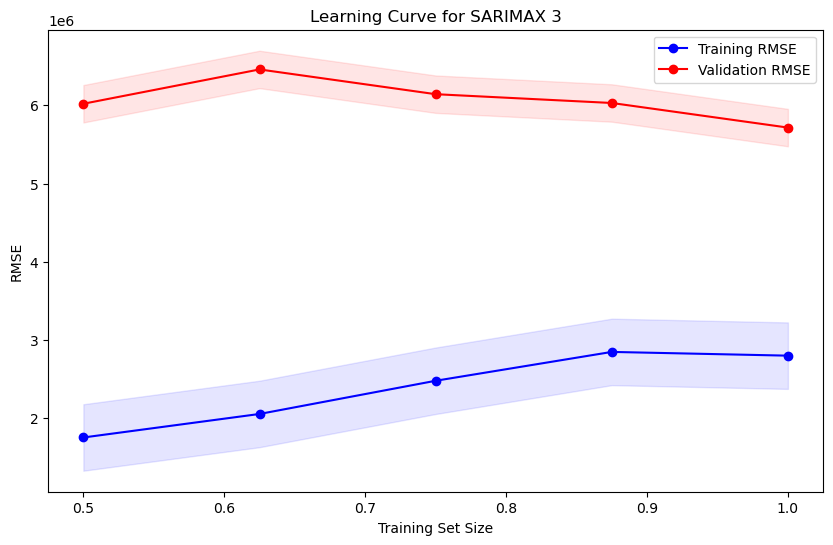

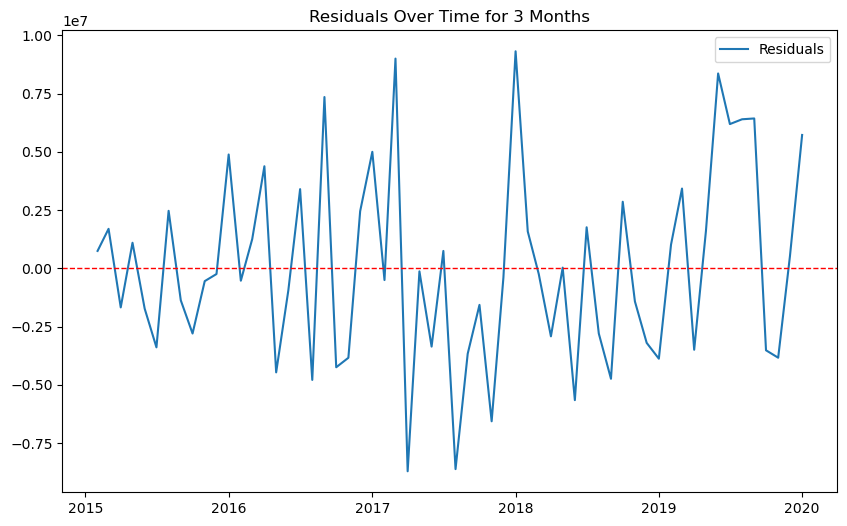

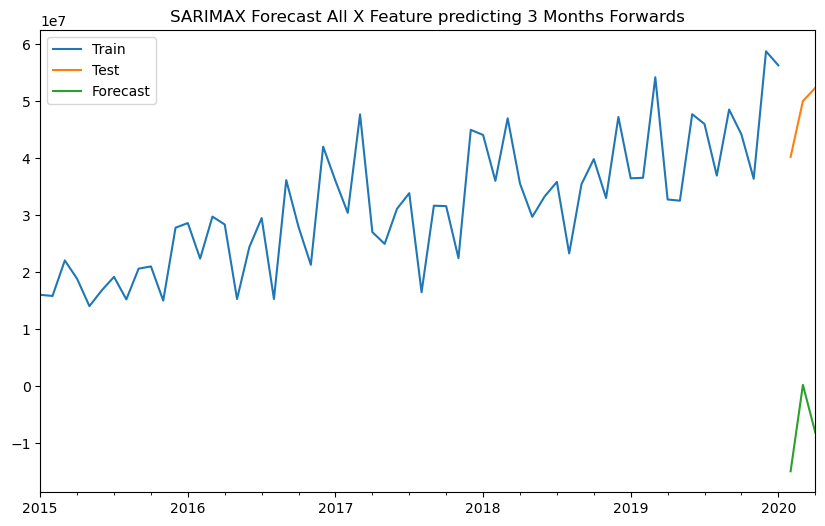

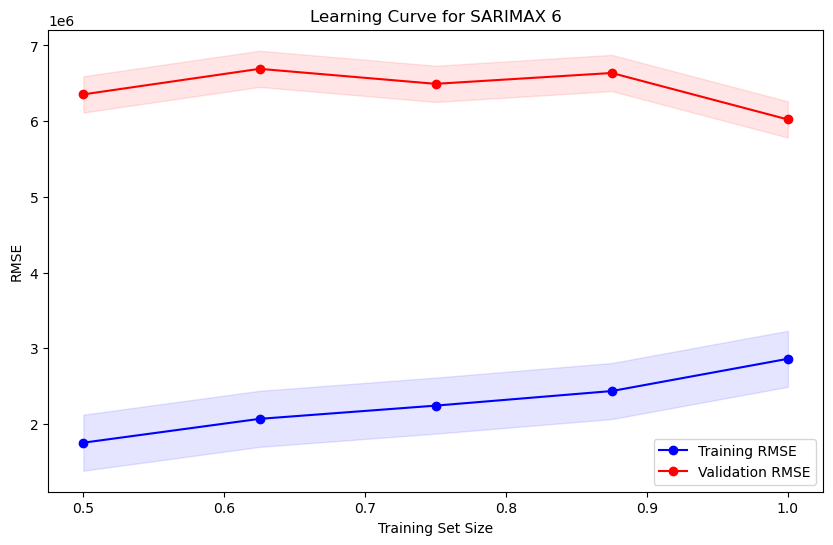

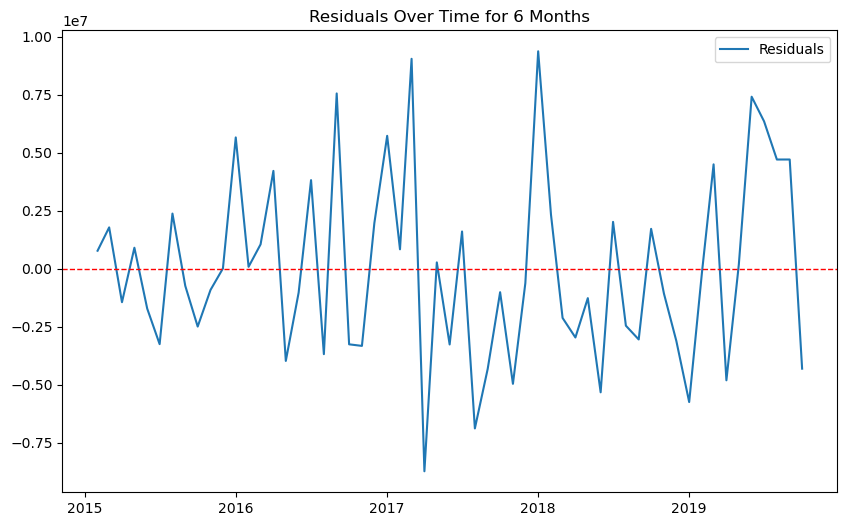

...

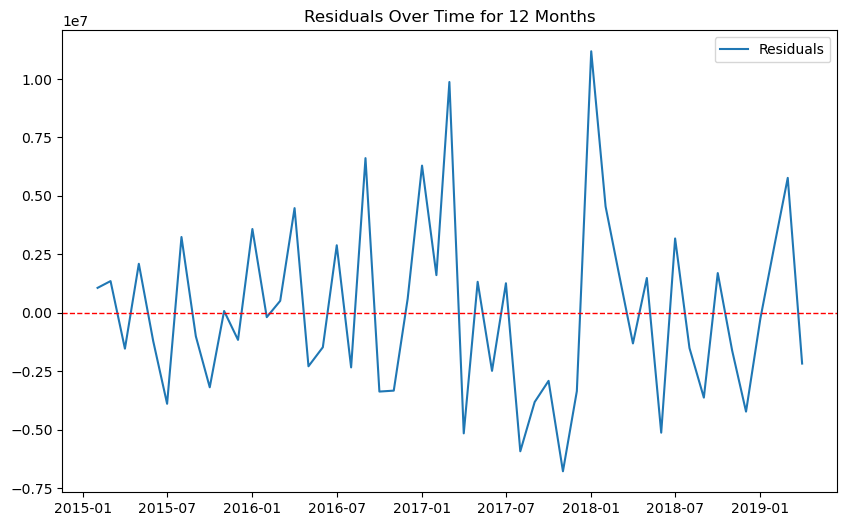

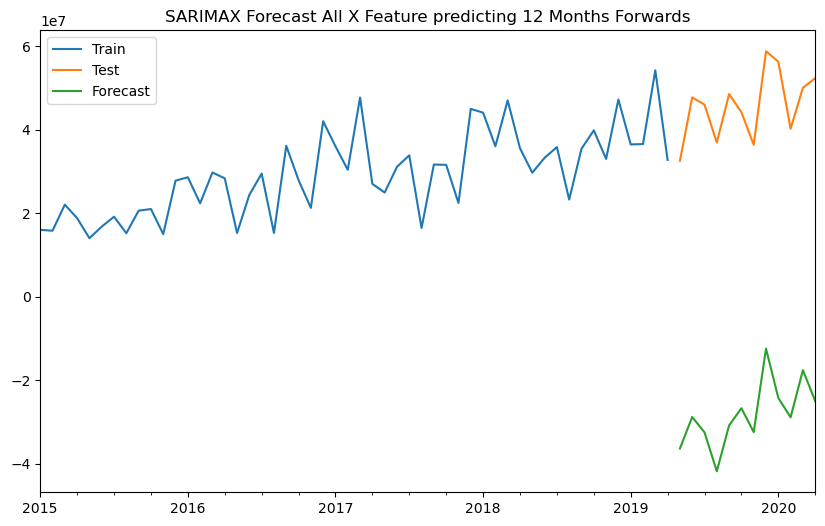

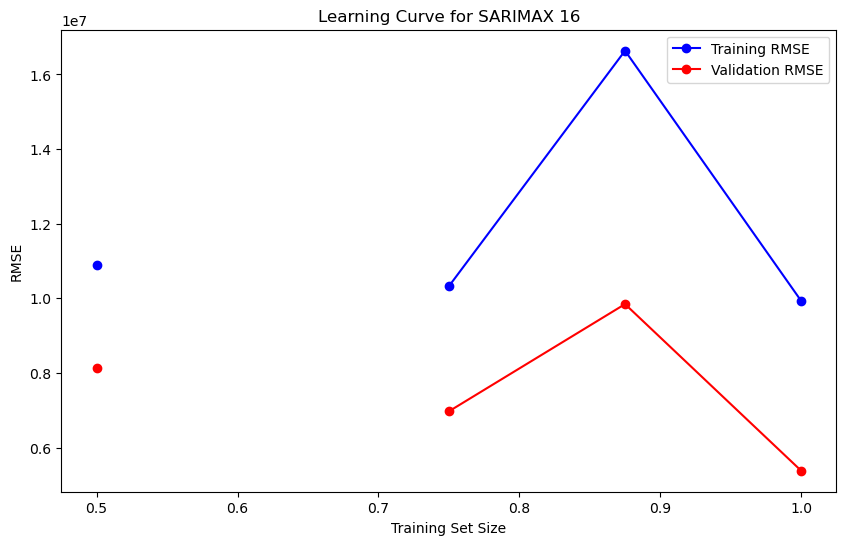

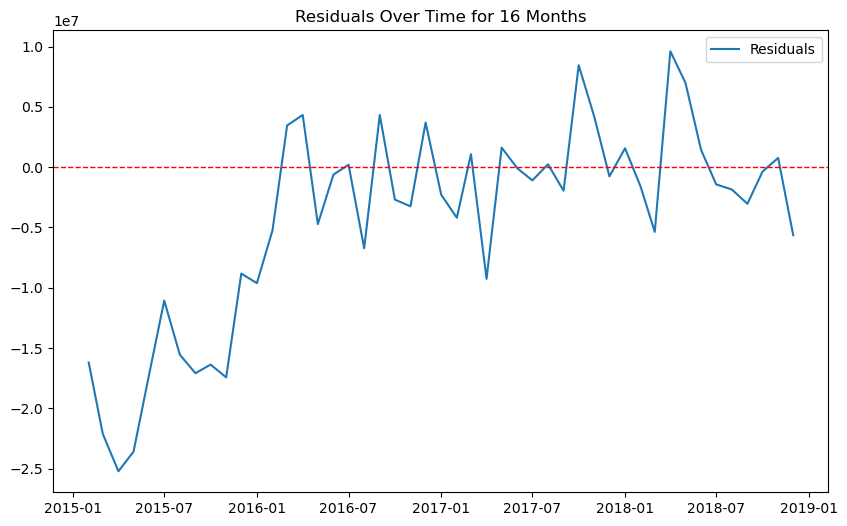

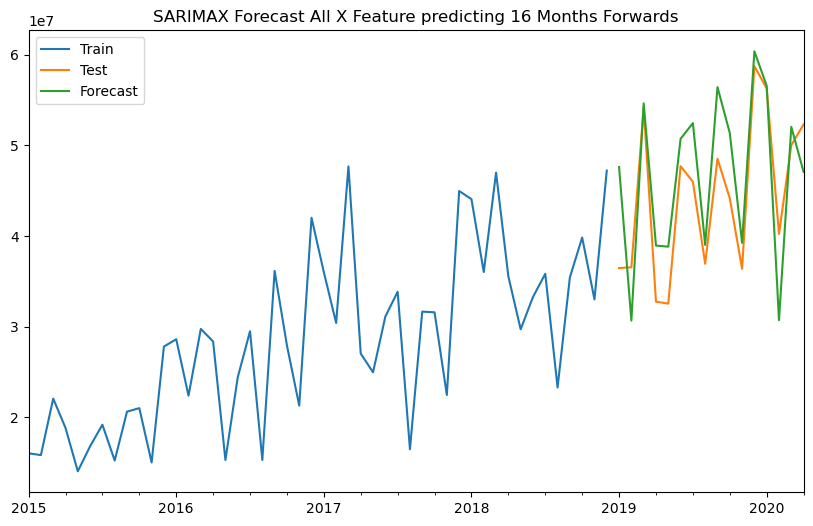

In [27]:
#setting up the random see of both Python and Numpy
random.seed(101)
np.random.seed(101)

X = df.drop(['Revenue','Year'], axis=1).copy()
y = df['Revenue'].copy()

for pred_value in [3,6,9,12,16]:
    X_train=X[:-pred_value]
    X_test=X[-pred_value:]

    y_train=y[:-pred_value]
    y_test=y[-pred_value:]

    X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
    X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
    y_train=y_train.diff().dropna()

    X_train_of=X_train.dropna()
    X_test_of=X_test

    def objective(trial):
        p = trial.suggest_int('p', 0, 3)
        d = trial.suggest_int('d', 0, 2)
        q = trial.suggest_int('q', 0, 3)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        disp_=trial.suggest_categorical('disp_',[True,False])

        tscv = TimeSeriesSplit(n_splits=5)
        rmse_list = []

        for train_index, test_index in tscv.split(X_train_of):
            #slicing the X and y features with the indexies
            X_train_split, X_test_split = X_train_of.iloc[train_index], X_train_of.iloc[test_index]
            y_train_split, y_test_split = y_train.iloc[train_index], y_train.iloc[test_index]

            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split, order=(p, d, q), seasonal_order=(P, D, Q, 12))
                results = sarima.fit(disp=disp_)
                forecast = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                # Debugging: Check forecast and y_test_split values
                #print(f"Forecast: {forecast[:5]}")  # Print the first 5 forecast values
                #print(f"y_test_split: {y_test_split[:5]}")  # Print the first 5 actual values

                rmse = mean_squared_error(y_test_split, forecast, squared=False)
                rmse_list.append(rmse)
            except Exception as e:
                print(f"Error during fitting: {e}")
                return np.inf

        return np.mean(rmse_list)

    rand_samp=optuna.samplers.RandomSampler(seed=101)
    study=optuna.create_study(direction='minimize',sampler=rand_samp)
    study.optimize(objective,n_trials=60)
    best_params=study.best_params
    best_score=study.best_trial.value
    print(f"Best Hyperparameters for {pred_value}: {best_params}")
    print(f'Best score for {best_params}: {best_score}')

    # Define training sizes
    tscv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store the results
    train_sizes = np.linspace(0.5, 1.0, 5)
    train_scores = []
    test_scores = []

    # Loop through different training set sizes
    for train_size in train_sizes:
        # Get the subset of the data based on the train size
        X_train_subset = X_train_of.iloc[:int(train_size * len(X_train_of))]
        y_train_subset = y_train.iloc[:int(train_size * len(y_train))]

        # Perform cross-validation
        rmse_train = []
        rmse_test = []

        for train_index, test_index in tscv.split(X_train_subset):
            # Slicing the X and y features with the indexes
            X_train_split, X_test_split = X_train_subset.iloc[train_index], X_train_subset.iloc[test_index]
            y_train_split, y_test_split = y_train_subset.iloc[train_index], y_train_subset.iloc[test_index]

            if len(X_train_split) == 0 or len(y_train_split) == 0:
                continue

            # Fit SARIMAX model
            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split,
                                 order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
                                seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'], 12))
                results = sarima.fit(disp=study.best_trial.params['disp_'])

                # Predict on train and test sets
                forecast_train = results.predict(start=0, end=len(y_train_split)-1, exog=X_train_split)
                forecast_test = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                # Calculate RMSE for train and test
                rmse_train.append(mean_squared_error(y_train_split, forecast_train, squared=False))
                rmse_test.append(mean_squared_error(y_test_split, forecast_test, squared=False))
            except Exception as e:
                print(f"Error during fitting: {e}")
                rmse_train.append(np.nan)
                rmse_test.append(np.nan)

        # Calculate mean RMSE for train and test for this train size
        train_scores.append(np.mean(rmse_train))
        test_scores.append(np.mean(rmse_test))

    # Convert to numpy arrays for plotting
    train_scores = np.array(train_scores)
    test_scores = np.array(test_scores)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores, 'o-', label='Training RMSE', color='blue')
    plt.plot(train_sizes, test_scores, 'o-', label='Validation RMSE', color='red')
    plt.fill_between(train_sizes, train_scores - np.std(train_scores), train_scores + np.std(train_scores), alpha=0.1, color='blue')
    plt.fill_between(train_sizes, test_scores - np.std(test_scores), test_scores + np.std(test_scores), alpha=0.1, color='red')
    plt.title(f'Learning Curve for SARIMAX {pred_value}')
    plt.xlabel('Training Set Size')
    plt.ylabel('RMSE')
    plt.legend(loc='best')

    sarima_of = SARIMAX(
        y_train,
        exog=X_train_of,
        order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
        seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'],12)
    ).fit(disp=study.best_trial.params['disp_'])

    residuals_of=sarima_of.resid
    plt.figure(figsize=(10, 6))
    plt.plot(residuals_of, label='Residuals')
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
    plt.title(f'Residuals Over Time for {pred_value} Months')
    plt.legend()

    # Prediction with exogenous variables
    start = len(X_train_of)
    end = len(X_train_of) + len(X_test_of)-1
    pred_sar_of = sarima_of.predict(
        start=start,
        end=end,
        exog=X_test_of,
        dynamic=False
    ).rename('sarima_of')

    # Plot results
    plt.figure(figsize=(10, 6))
    y[:-pred_value].plot(label='Train', legend=True)
    y_test.plot(label='Test', legend=True)
    pred_sar_of.plot(label='Forecast', legend=True)
    plt.title(f'SARIMAX Forecast All X Feature predicting {pred_value} Months Forwards')

When we use all the features, we do not get a model that we can use. Either we do not get enough results to clearly see if the model is underfitting or overfitting, and when we do get enough results, the models are clearly overfitting or underfitting.

This tells us that the feature selection process is important, otherwise we would have got a similar or even better model.

Next we try to scale the X features to see if scaling improves the performance of the model.

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\300333763.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
[I 2025-02-08 00:11:21,084] A new study created in memory with name: no-name-14428f13-130d-47e6-b8f8-a50f7c0b7e63
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtyp

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Li

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functio

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA paramete

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Best Hyperparameters for 3: {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'disp_': False}
Best score for {'p': 3, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'disp_': False}: 5245755.286588179


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Lik

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Best Hyperparameters for 6: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5615404.28248403


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA paramete

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warn

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Best Hyperparameters for 9: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5289710.945489539


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA paramete

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting 

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA paramete

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To ca

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the functi

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Best Hyperparameters for 12: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}
Best score for {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}: 5266134.287913927


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the r

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to 

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squa

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting 

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'roo

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Usin

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2025-02-08 00:17:45,025] Trial 38 finished with value: 9679574.723127197 and parameters: {'p': 0, 'd': 1, 'q': 3, 'P': 1, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 6 with value: 5085734.549190114.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_

Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observa

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use th

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

Best Hyperparameters for 16: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'disp_': True}
Best score for {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'disp_': True}: 5085734.549190114


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
C:\Users\

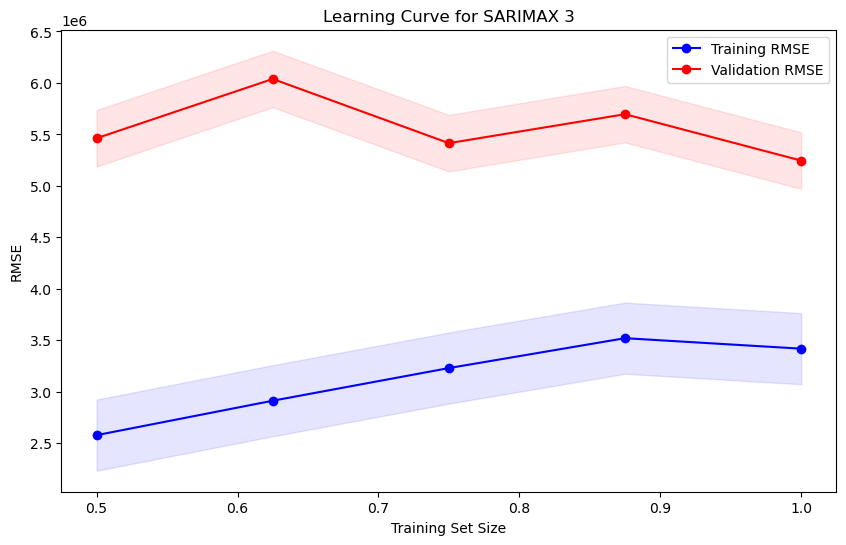

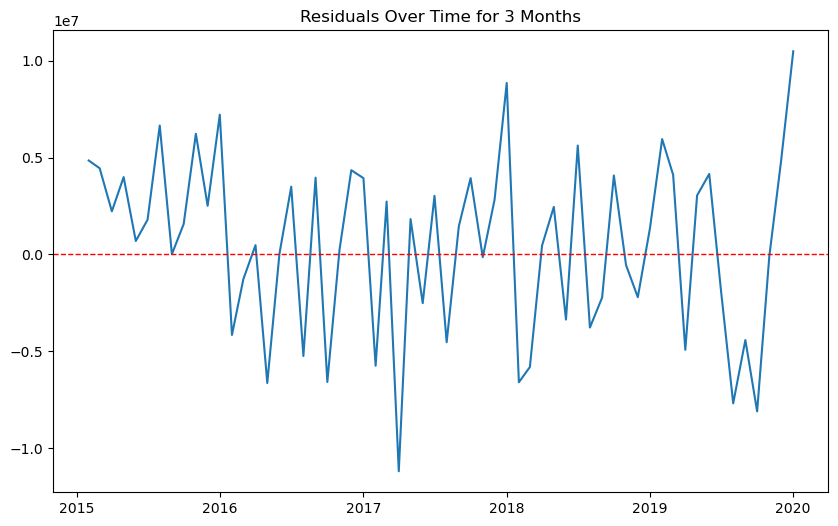

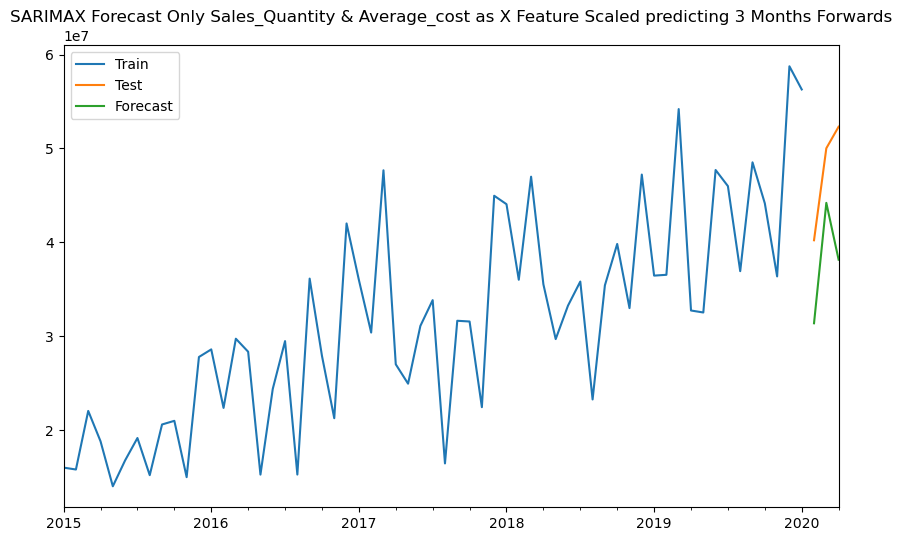

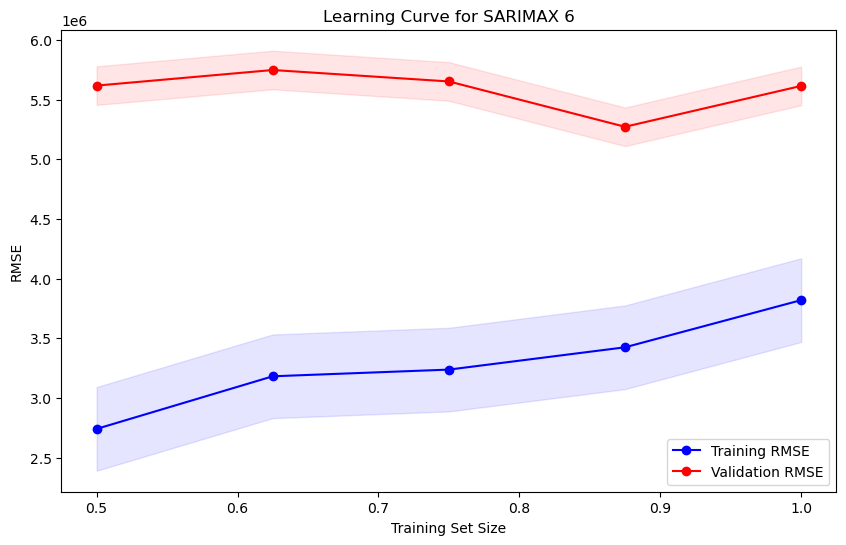

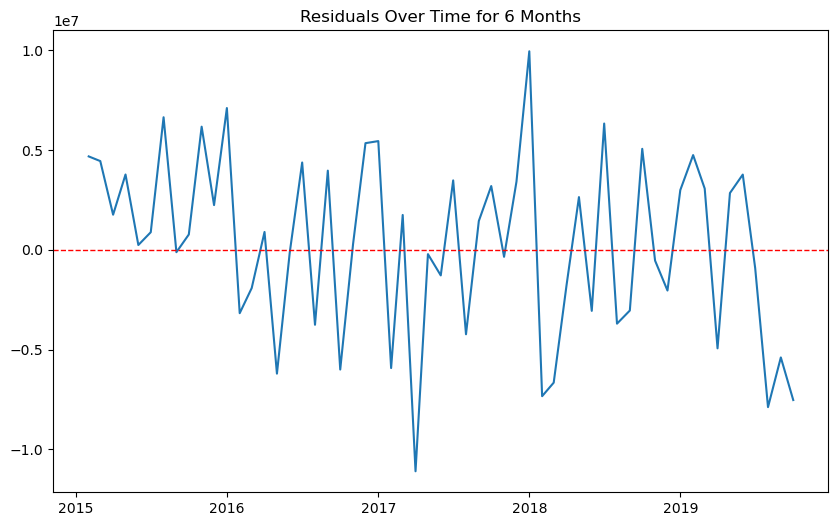

...

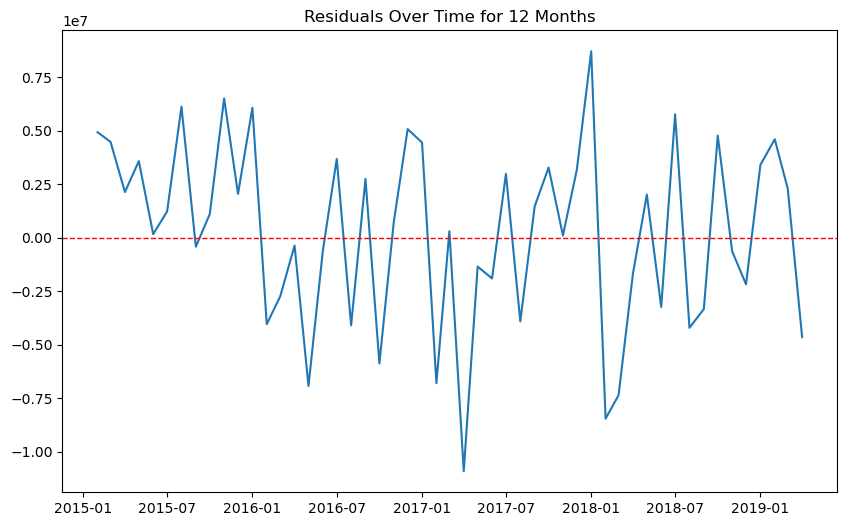

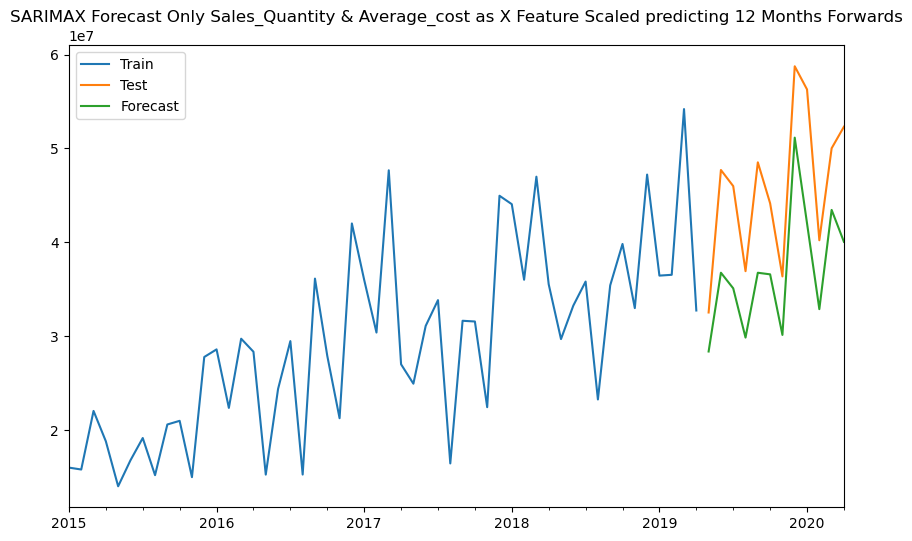

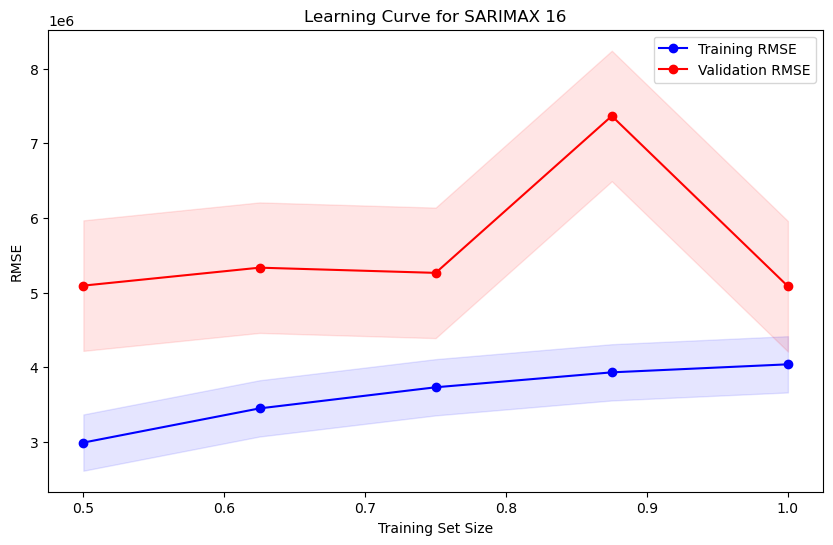

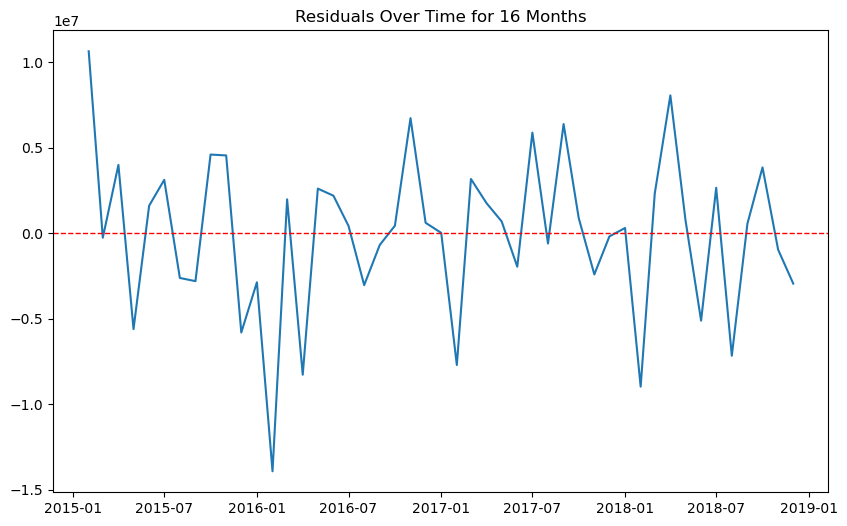

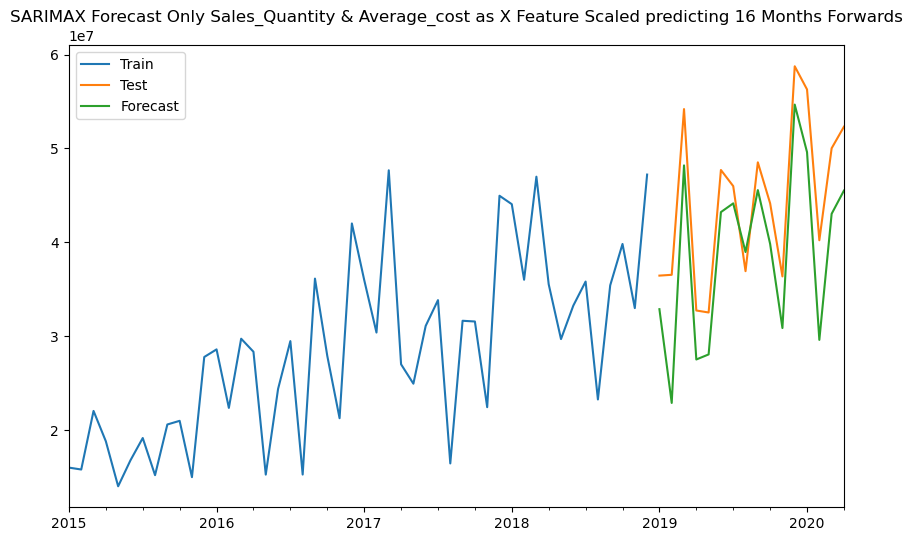

In [28]:
#all statistically significant X features & X feature scaling
X = df.drop(['Revenue','Year','The_average_annual_payroll_of_the_region'], axis=1)
y = df['Revenue']

for pred_value in [3,6,9,12,16]:
    X_train=X[:-pred_value]
    X_test=X[-pred_value:]

    y_train=y[:-pred_value]
    y_test=y[-pred_value:]

    X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
    y_train_diff=y_train.diff().dropna()

    X_train_of=X_train[['Sales_quantity','Average_cost']].dropna()
    X_test_of=X_test[['Sales_quantity','Average_cost']]

    scaler_X=StandardScaler()

    scaled_X_train_of=scaler_X.fit_transform(X_train_of)
    scaled_X_test_of=scaler_X.transform(X_test_of)

    scaled_X_train_of=pd.DataFrame(scaled_X_train_of,index=X_train_of.index,columns=['Sales_quantity','Average_cost'],dtype=float)
    scaled_X_test_of=pd.DataFrame(scaled_X_test_of,index=X_test_of.index,columns=['Sales_quantity','Average_cost'],dtype=float)

    def objective(trial):
        p = trial.suggest_int('p', 0, 3)
        d = trial.suggest_int('d', 0, 2)
        q = trial.suggest_int('q', 0, 3)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        disp_=trial.suggest_categorical('disp_',[True,False])

        tscv = TimeSeriesSplit(n_splits=5)
        rmse_list = []

        for train_index, test_index in tscv.split(scaled_X_train_of):
            #slicing the X and y features with the indexies
            X_train_split, X_test_split = scaled_X_train_of.iloc[train_index], scaled_X_train_of.iloc[test_index]
            y_train_split, y_test_split = y_train_diff.iloc[train_index], y_train_diff.iloc[test_index]

            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split, order=(p, d, q), seasonal_order=(P, D, Q, 12))
                results = sarima.fit(disp=disp_)
                forecast = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                rmse = mean_squared_error(y_test_split,forecast, squared=False)
                rmse_list.append(rmse)
            except Exception as e:
                print(f"Error during fitting: {e}")
                return np.inf

        return np.mean(rmse_list)

    rand_samp=optuna.samplers.RandomSampler(seed=101)
    study=optuna.create_study(direction='minimize',sampler=rand_samp)
    study.optimize(objective,n_trials=60)
    best_params=study.best_params
    best_score=study.best_trial.value
    print(f"Best Hyperparameters for {pred_value}: {best_params}")
    print(f'Best score for {best_params}: {best_score}')

    # Define training sizes
    tscv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store the results
    train_sizes = np.linspace(0.5, 1.0, 5)
    train_scores = []
    test_scores = []

    # Loop through different training set sizes
    for train_size in train_sizes:
        # Get the subset of the data based on the train size
        X_train_subset = scaled_X_train_of.iloc[:int(train_size * len(scaled_X_train_of))]
        y_train_subset = y_train_diff.iloc[:int(train_size * len(y_train_diff))]

        # Perform cross-validation
        rmse_train = []
        rmse_test = []

        for train_index, test_index in tscv.split(X_train_subset):
            # Slicing the X and y features with the indexes
            X_train_split, X_test_split = X_train_subset.iloc[train_index], X_train_subset.iloc[test_index]
            y_train_split, y_test_split = y_train_subset.iloc[train_index], y_train_subset.iloc[test_index]

            if len(X_train_split) == 0 or len(y_train_split) == 0:
                continue

            # Fit SARIMAX model
            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split,
                                 order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
                                 seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'],12))
                results = sarima.fit(disp=study.best_trial.params['disp_'])

                # Predict on train and test sets
                forecast_train = results.predict(start=0, end=len(y_train_split)-1, exog=X_train_split)
                forecast_test = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                # Calculate RMSE for train and test
                rmse_train.append(mean_squared_error(y_train_split, forecast_train, squared=False))
                rmse_test.append(mean_squared_error(y_test_split, forecast_test, squared=False))
            except Exception as e:
                print(f"Error during fitting: {e}")
                rmse_train.append(np.nan)
                rmse_test.append(np.nan)

        # Calculate mean RMSE for train and test for this train size
        train_scores.append(np.mean(rmse_train))
        test_scores.append(np.mean(rmse_test))

    # Convert to numpy arrays for plotting
    train_scores = np.array(train_scores)
    test_scores = np.array(test_scores)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores, 'o-', label='Training RMSE', color='blue')
    plt.plot(train_sizes, test_scores, 'o-', label='Validation RMSE', color='red')
    plt.fill_between(train_sizes, train_scores - np.std(train_scores), train_scores + np.std(train_scores), alpha=0.1, color='blue')
    plt.fill_between(train_sizes, test_scores - np.std(test_scores), test_scores + np.std(test_scores), alpha=0.1, color='red')
    plt.title(f'Learning Curve for SARIMAX {pred_value}')
    plt.xlabel('Training Set Size')
    plt.ylabel('RMSE')
    plt.legend(loc='best')

    sarima_of = SARIMAX(
        y_train_diff,
        exog=scaled_X_train_of,
        order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
        seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'],12)
    ).fit(disp=study.best_trial.params['disp_'])

    residuals_of=sarima_of.resid
    plt.figure(figsize=(10, 6))
    plt.plot(residuals_of, label='Residuals')
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
    plt.title(f'Residuals Over Time for {pred_value} Months')

    # Prediction with exogenous variables
    start = len(X_train_of)
    end = len(X_train_of) + len(X_test_of)-1
    scaled_pred_sar_of = sarima_of.predict(
        start=start,
        end=end,
        exog=scaled_X_test_of,
        dynamic=study.best_trial.params['disp_']
    )

    # Plot results
    plt.figure(figsize=(10, 6))
    y_train.plot(label='Train', legend=True)
    y_test.plot(label='Test', legend=True)
    scaled_pred_sar_of.plot(label='Forecast', legend=True)
    plt.title(f'SARIMAX Forecast Only Sales_Quantity & Average_cost as X Feature Scaled predicting {pred_value} Months Forwards')

Scaling has really improved our model. This time we get the best result with a prediction period of 16 months. The model looks like a good fit and the residuals look random.

Next, we look at whether scaling improves the model when we use all the available X features.

C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2629337587.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\2629337587.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
[I 2025-02-08 00:18:14,684] A new study created in memory with name: no-name-f0656ed0-f0c9-4ff3-

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:16,424] Trial 1 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 1, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45D70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D706CAB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44AB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B442D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44210> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:16,743] Trial 6 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46F70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B447B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47570> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44150> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46910> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:16,951] Trial 12 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6915590> instead.


[I 2025-02-08 00:18:17,504] Trial 13 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
[I 2025-02-08 00:18:17,658] Trial 14 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:17,702] Trial 15 finished with value: 

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BCE10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47E10> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:17,845] Trial 16 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6915110> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68B52F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44090> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45D10> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:18,041] Trial 19 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 1, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  wa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6917CF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68B7390> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46430> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47030> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed t

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47390> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6916070> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BFDB0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:19,088] Trial 27 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:19,158] Trial 28 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estim

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45830> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6916CD0> instead.


[I 2025-02-08 00:18:20,560] Trial 29 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
[I 2025-02-08 00:18:20,588] Trial 30 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:20,652] Trial 31 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BFC90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B459B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47210> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45590> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:20,923] Trial 34 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Li

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46FD0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44510> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BE010> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45050> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B476F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:21,149] Trial 40 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 3, 'P': 1, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46130> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B466D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B461F0> instead.


[I 2025-02-08 00:18:21,437] Trial 43 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:21,624] Trial 44 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45530> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45E30> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:21,669] Trial 45 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 3, 'P': 0, 'D': 1, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6916790> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BF450> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BD230> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:21,953] Trial 48 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-0

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47AB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68B5590> instead.
Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:18:22,536] Trial 50 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 1, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
[I 2025-02-08 00:18:22,624] Trial 51 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:22,643] Trial 52 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 3, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6915CB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B472D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45950> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BCC30> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:22,862] Trial 55 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 3, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  wa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44210> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68BE190> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B474B0> instead.
Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:18:24,568] Trial 59 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D49FCD50> instead.
Best Hyperparameters for 3: {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}: inf
Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn(

Error during fitting: Schur decomposition solver error.
Error during fitting: LU decomposition error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63A50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62610> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61290> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:41,979] Trial 4 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 3, 'P': 1, 'D': 1, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B629D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62F10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61110> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62A30> instead.


[I 2025-02-08 00:18:42,237] Trial 8 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:42,280] Trial 9 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\st

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B633F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60C90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B634B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62F10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60450> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:18:43,478] Trial 14 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:43,529] Trial 15 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 3, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61FB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62190> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:43,815] Trial 16 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B636F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B621F0> instead.


[I 2025-02-08 00:18:44,040] Trial 18 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 3, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:44,083] Trial 19 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 1, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\ts

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62F10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62430> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62670> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B639F0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:44,292] Trial 22 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 3, 'P': 2, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63CF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61650> instead.


[I 2025-02-08 00:18:44,745] Trial 24 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1235: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /
[I 2025-02-08 00:18:44,768] Trial 25 finished with value: i

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62FD0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B611D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60BD0> instead.


[I 2025-02-08 00:18:45,143] Trial 27 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:45,200] Trial 28 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62790> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B637B0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63270> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62130> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B600F0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
[I 2025-02-08 00:18:46,949] Trial 33 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too f

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60F90> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:18:47,533] Trial 34 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
[I 2025-02-08 00:18:47,551] Trial 35 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60270> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62EB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61B30> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60870> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61290> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:47,752] Trial 41 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:47,763] Trial 42 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63A50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62010> instead.


[I 2025-02-08 00:18:48,045] Trial 43 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63C90> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:48,296] Trial 44 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60450> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60CF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B618F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B610B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B60090> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68ADCB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B61BF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63990> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:18:49,302] Trial 54 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78E7E70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B62490> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63D50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7B63150> instead.


[I 2025-02-08 00:18:50,831] Trial 58 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
[I 2025-02-08 00:18:50,873] Trial 59 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D89650> instead.
Best Hyperparameters for 6: {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}: inf


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.
Error during fitting: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn(

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:05,090] Trial 1 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 1, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B0F90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7AFCE70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D131B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3ED0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B0AB0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:05,317] Trial 6 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting p

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46190> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B1F50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B1890> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B0810> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B2310> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:05,539] Trial 12 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3270> instead.


[I 2025-02-08 00:19:06,095] Trial 13 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
[I 2025-02-08 00:19:06,266] Trial 14 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.


Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE5110> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B19B0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:06,312] Trial 15 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 3, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B44330> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3210> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B23D0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:06,673] Trial 19 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 1, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  wa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B2D90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B25B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B2550> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D76BEC70> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:06,898] Trial 23 finished with value: inf and parameters: {'p': 0, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\st

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3330> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B1E30> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B1AD0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B0F30> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:07,192] Trial 27 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B47990> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45890> instead.
Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:19:08,712] Trial 30 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:08,771] Trial 31 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\ts

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B440F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3210> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3D50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B3ED0> instead.


[I 2025-02-08 00:19:09,120] Trial 34 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:09,183] Trial 35 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B1650> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE40F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B0AB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B18F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE5470> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:09,423] Trial 41 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:09,434] Trial 42 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B36F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE6310> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B452F0> instead.


[I 2025-02-08 00:19:09,808] Trial 44 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:09,849] Trial 45 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 3, 'P': 0, 'D': 1, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE7B10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE79F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68AEEB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B46C10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE5F50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7AFEFD0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE4030> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2DD6B2490> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:10,918] Trial 54 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE62B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6B45350> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D68E3510> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D76BD710> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D131B0> instead.
Best Hyperparameters for 9: {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}: inf


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28330> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:27,931] Trial 2 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29290> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A730> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29D10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2BAB0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:28,225] Trial 6 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:28,259] Trial 7 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregr

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28690> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790D4D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A190> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A310> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2B330> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:19:29,226] Trial 14 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:29,285] Trial 15 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 3, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE7E10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2AB50> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:29,458] Trial 16 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\s

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3C9F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29FB0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:29,682] Trial 18 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 3, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate startin

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E294D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29A10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A6D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2B150> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2BE70> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:29,922] Trial 23 finished with value: inf and parameters: {'p': 0, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6915530> instead.


[I 2025-02-08 00:19:30,310] Trial 24 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:30,335] Trial 25 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\ts

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2AE50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2BE70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28E10> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed t

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2B0F0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:31,177] Trial 28 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encount

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2AE50> instead.


[I 2025-02-08 00:19:32,904] Trial 29 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
[I 2025-02-08 00:19:32,945] Trial 30 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:32,995] Trial 31 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE7F90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E297D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2BCF0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:33,162] Trial 33 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A1F0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:33,825] Trial 34 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood 

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28FF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A610> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E295F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2B630> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790F0F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28D50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2BC90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29890> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7E63D50> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:34,610] Trial 43 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\s

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E29710> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790E310> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:34,829] Trial 45 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 3, 'P': 0, 'D': 1, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3EA30> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3F930> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790E010> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3CC90> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3DD10> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790E490> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E2A6D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6E28510> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:36,048] Trial 54 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3FAB0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790D5F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE7B10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790FF90> instead.


[I 2025-02-08 00:19:37,827] Trial 58 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
[I 2025-02-08 00:19:37,885] Trial 59 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7BE4150> instead.
Best Hyperparameters for 12: {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}: inf


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.
Error during fitting: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5C50> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A45D0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:54,626] Trial 3 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 2, 'P': 1, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6ACB750> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A4210> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5DD0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4F990> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:54,850] Trial 7 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 0, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6610> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6AF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5D3D4D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A4870> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A47B0> instead.


[I 2025-02-08 00:19:55,038] Trial 12 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret 

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7EEA850> instead.


[I 2025-02-08 00:19:55,598] Trial 13 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: Schur decomposition solver error.


[I 2025-02-08 00:19:55,929] Trial 14 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 2, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:55,971] Trial 15 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 3, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7C0D410> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5470> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:56,268] Trial 16 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5CCFF30> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7750> instead.


[I 2025-02-08 00:19:56,470] Trial 18 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 3, 'P': 1, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:56,506] Trial 19 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 1, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\ts

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A68B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A79F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7030> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6C70> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:56,692] Trial 22 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 3, 'P': 2, 'D': 1, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  war

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6AC83F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6FD0> instead.


[I 2025-02-08 00:19:57,187] Trial 24 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1235: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /
[I 2025-02-08 00:19:57,205] Trial 25 finished with value: i

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7870> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A58F0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5410> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:19:57,529] Trial 27 finished with value: inf and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\st

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6370> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A6550> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6DFDD70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5890> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A42D0> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
[I 2025-02-08 00:19:59,252] Trial 33 finished with value: inf and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 0, 'D': 0, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too f

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A4450> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-02-08 00:19:59,845] Trial 34 finished with value: inf and parameters: {'p': 3, 'd': 2, 'q': 2, 'P': 2, 'D': 0, 'Q': 2, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
[I 2025-02-08 00:19:59,866] Trial 35 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 2, 'P': 0, 'D

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7E10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A5B30> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6DFEF10> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4D7D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7090> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:20:00,111] Trial 41 finished with value: inf and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:20:00,126] Trial 42 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'disp_': False}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A7810> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D5CCE0D0> instead.


[I 2025-02-08 00:20:00,422] Trial 43 finished with value: inf and parameters: {'p': 3, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A4A50> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:20:00,654] Trial 44 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 2, 'D': 0, 'Q': 0, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7EE8E70> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4C330> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D790EAF0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6AC8630> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4C7B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of num

C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D78A72D0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4C7B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4CF90> instead.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
[I 2025-02-08 00:20:01,655] Trial 54 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 3, 'P': 2, 'D': 0, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn

Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4F330> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D8D4F1B0> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6ACA010> instead.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D7EEA310> instead.


[I 2025-02-08 00:20:03,412] Trial 58 finished with value: inf and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 1, 'Q': 1, 'disp_': True}. Best is trial 0 with value: inf.
[I 2025-02-08 00:20:03,453] Trial 59 finished with value: inf and parameters: {'p': 0, 'd': 2, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 'disp_': False}. Best is trial 0 with value: inf.


Error during fitting: Schur decomposition solver error.
Error during fitting: The 'y_pred' parameter of mean_squared_error must be an array-like. Got <built-in method reshape of numpy.ndarray object at 0x000002E2D6ACB630> instead.
Best Hyperparameters for 16: {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}
Best score for {'p': 2, 'd': 1, 'q': 0, 'P': 0, 'D': 1, 'Q': 2, 'disp_': False}: inf


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\gandj\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal A

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.
Error during fitting: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.
Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few obse

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

Error during fitting: Schur decomposition solver error.


C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\gandj\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the ro

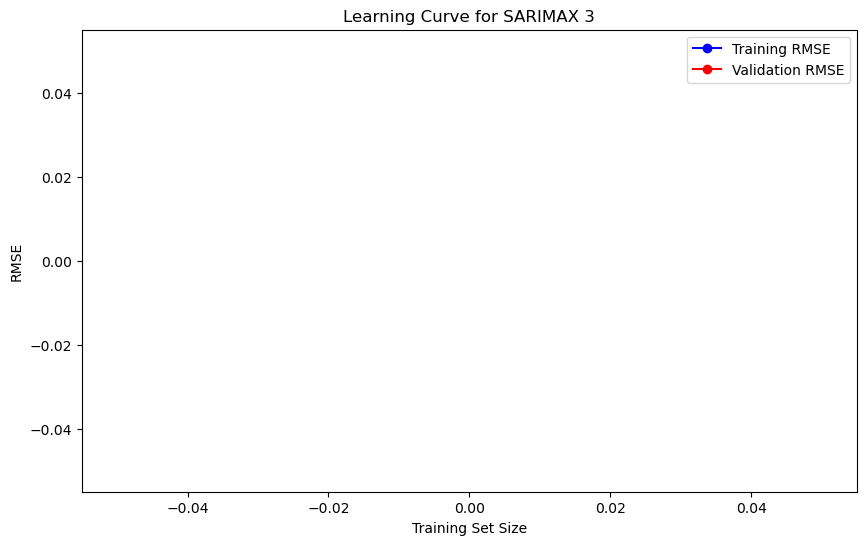

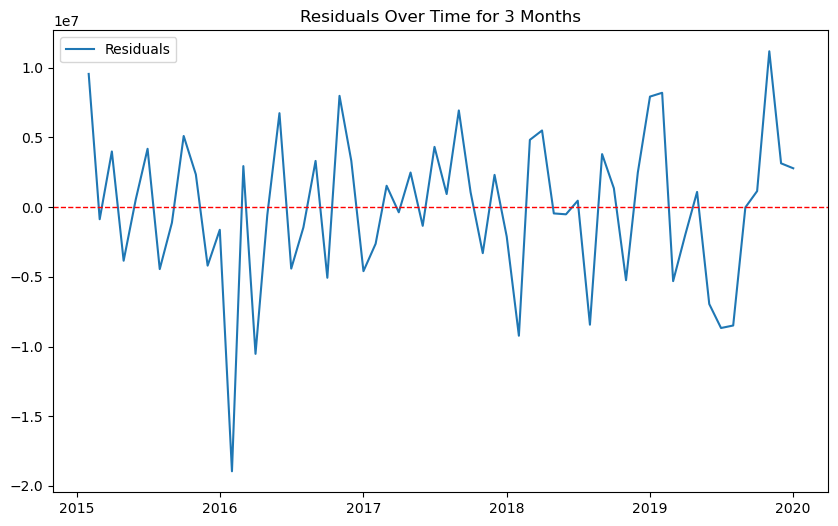

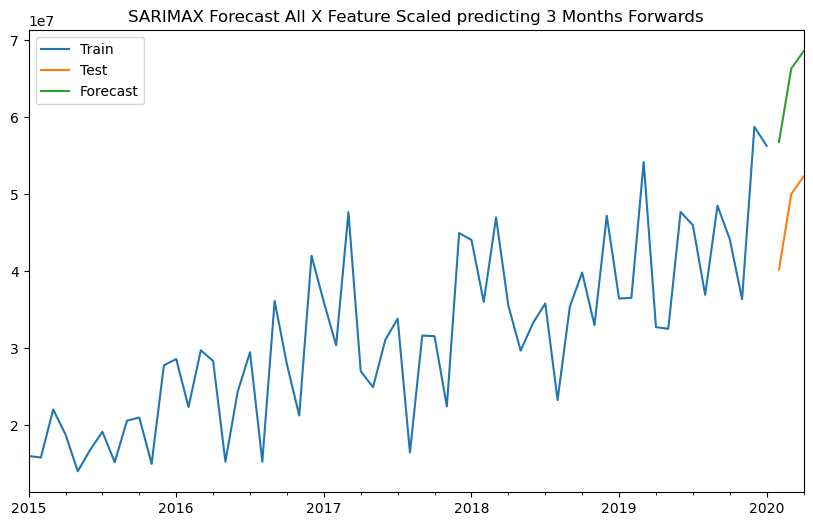

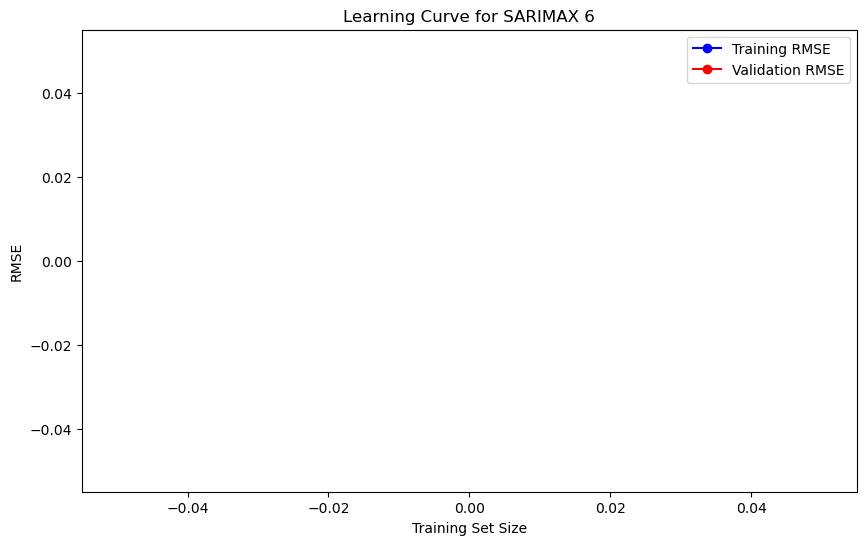

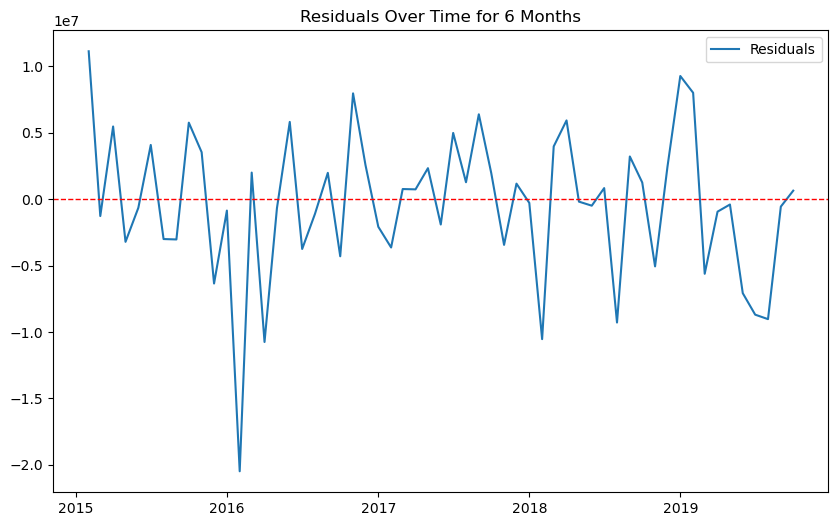

...

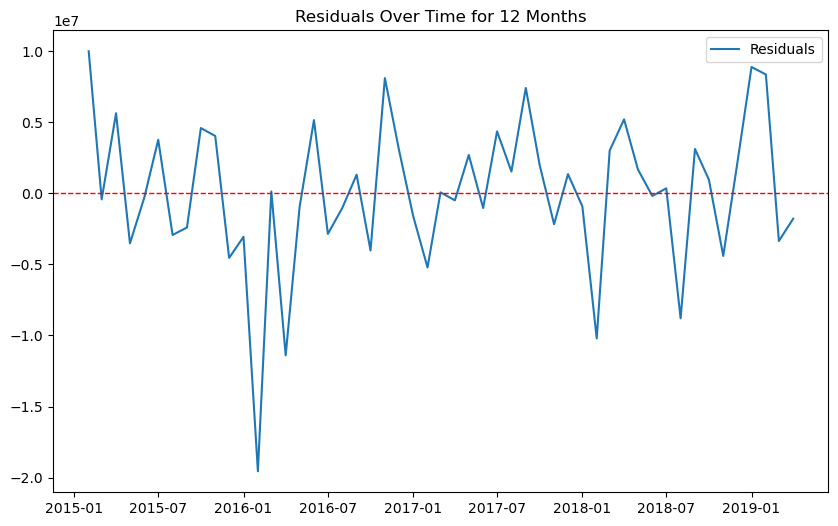

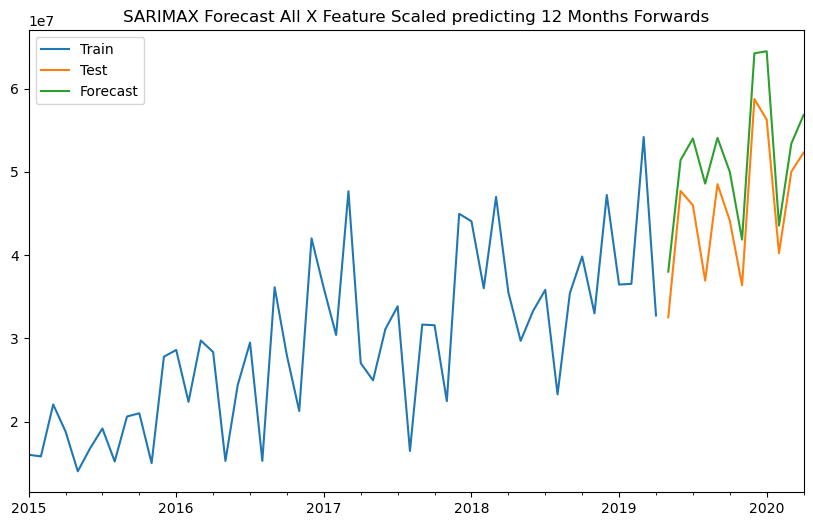

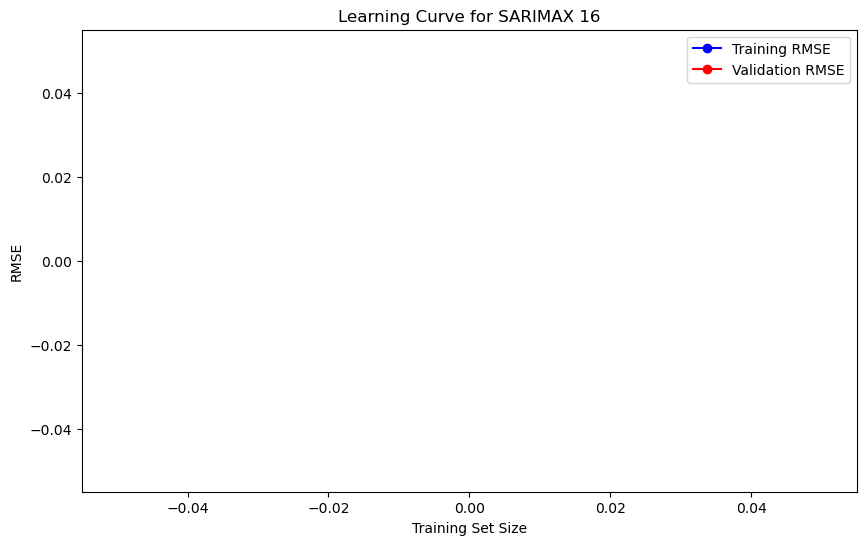

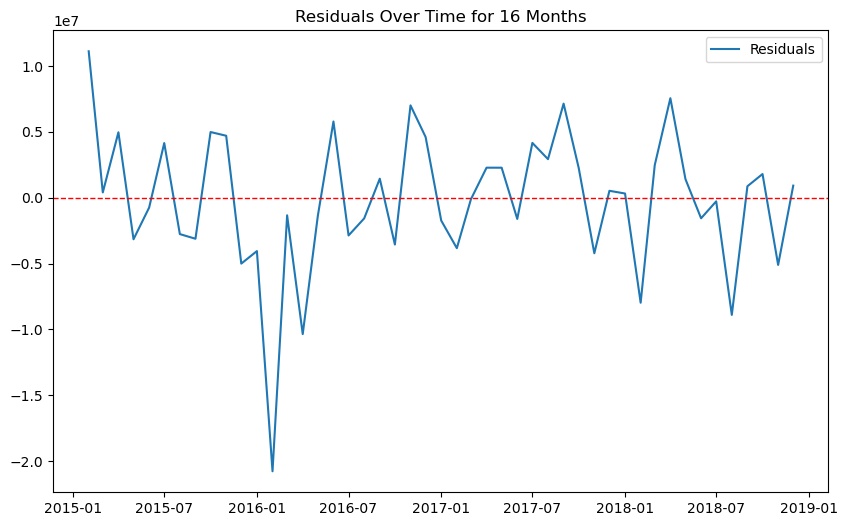

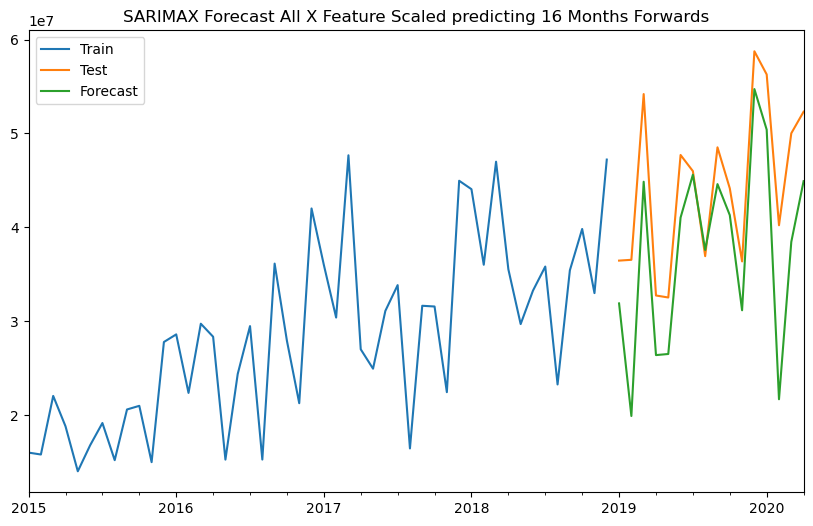

In [29]:
#Scaling only X Features and using all X features

X = df.drop(['Revenue','Year'], axis=1)
y = df['Revenue']

for pred_value in [3,6,9,12,16]:
    X_train=X[:-pred_value]
    X_test=X[-pred_value:]

    y_train=y[:-pred_value]
    y_test=y[-pred_value:]

    X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
    X_train['The_average_annual_payroll_of_the_region']=X_train['The_average_annual_payroll_of_the_region'].diff().dropna()
    y_train_of=y_train.diff().dropna()

    scaler_X=StandardScaler()
    min_max_X=MinMaxScaler()

    scaled_X_train_of=scaler_X.fit_transform(X_train[['Sales_quantity','Average_cost']])
    scaled_X_test_of=scaler_X.transform(X_test[['Sales_quantity','Average_cost']])
    min_max_X_train_of=min_max_X.fit_transform(X_train['The_average_annual_payroll_of_the_region'].values.reshape(-1,1))
    min_max_X_test_of=min_max_X.transform(X_test['The_average_annual_payroll_of_the_region'].values.reshape(-1,1))

    scaled_X_train_of=pd.DataFrame(scaled_X_train_of,index=X_train.index,columns=['Sales_quantity','Average_cost'],dtype=float)
    scaled_X_test_of=pd.DataFrame(scaled_X_test_of,index=X_test.index,columns=['Sales_quantity','Average_cost'],dtype=float)
    min_max_X_train_of=pd.DataFrame(min_max_X_train_of,index=X_train.index,columns=['The_average_annual_payroll_of_the_region'],dtype=float)
    min_max_X_test_of=pd.DataFrame(min_max_X_test_of,index=X_test.index,columns=['The_average_annual_payroll_of_the_region'],dtype=float)

    scaled_X_train_of=pd.concat([scaled_X_train_of,min_max_X_train_of],axis=1).dropna()
    scaled_X_test_of=pd.concat([scaled_X_test_of,min_max_X_test_of],axis=1).dropna()

    def objective(trial):
        p = trial.suggest_int('p', 0, 3)
        d = trial.suggest_int('d', 0, 2)
        q = trial.suggest_int('q', 0, 3)
        P = trial.suggest_int('P', 0, 2)
        D = trial.suggest_int('D', 0, 1)
        Q = trial.suggest_int('Q', 0, 2)
        disp_=trial.suggest_categorical('disp_',[True,False])

        tscv = TimeSeriesSplit(n_splits=5)
        rmse_list = []

        for train_index, test_index in tscv.split(scaled_X_train_of):
            #slicing the X and y features with the indexies
            X_train_split, X_test_split = scaled_X_train_of.iloc[train_index], scaled_X_train_of.iloc[test_index]
            y_train_split, y_test_split = y_train_of.iloc[train_index], y_train_of.iloc[test_index]

            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split, order=(p, d, q), seasonal_order=(P, D, Q, 12))
                results = sarima.fit(disp=disp_)
                forecast = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                rmse = mean_squared_error(y_test_split, forecast.values.reshape, squared=False)
                rmse_list.append(rmse)
            except Exception as e:
                print(f"Error during fitting: {e}")
                return np.inf

        return np.mean(rmse_list)

    rand_samp=optuna.samplers.RandomSampler(seed=101)
    study=optuna.create_study(direction='minimize',sampler=rand_samp)
    study.optimize(objective,n_trials=60)
    best_params=study.best_params
    best_score=study.best_trial.value
    print(f"Best Hyperparameters for {pred_value}: {best_params}")
    print(f'Best score for {best_params}: {best_score}')

    # Define training sizes
    tscv = TimeSeriesSplit(n_splits=5)

    # Initialize lists to store the results
    train_sizes = np.linspace(0.5, 1.0, 5)
    train_scores = []
    test_scores = []

    # Loop through different training set sizes
    for train_size in train_sizes:
        # Get the subset of the data based on the train size
        X_train_subset = scaled_X_train_of.iloc[:int(train_size * len(scaled_X_train_of))]
        y_train_subset = y_train_of.iloc[:int(train_size * len(y_train_of))]

        # Perform cross-validation
        rmse_train = []
        rmse_test = []

        for train_index, test_index in tscv.split(X_train_subset):
            # Slicing the X and y features with the indexes
            X_train_split, X_test_split = X_train_subset.iloc[train_index], X_train_subset.iloc[test_index]
            y_train_split, y_test_split = y_train_subset.iloc[train_index], y_train_subset.iloc[test_index]

            if len(X_train_split) == 0 or len(y_train_split) == 0:
                continue

            # Fit SARIMAX model
            try:
                sarima = SARIMAX(y_train_split, exog=X_train_split,
                                 order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
                                seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'],12))
                results = sarima.fit(disp=study.best_trial.params['disp_'])

                # Predict on train and test sets
                forecast_train = results.predict(start=0, end=len(y_train_split)-1, exog=X_train_split)
                forecast_test = results.predict(start=len(y_train_split), end=len(y_train_split) + len(y_test_split) - 1, exog=X_test_split)

                # Calculate RMSE for train and test
                rmse_train.append(mean_squared_error(y_train_split, forecast_train, squared=False))
                rmse_test.append(mean_squared_error(y_test_split, forecast_test, squared=False))
            except Exception as e:
                print(f"Error during fitting: {e}")
                rmse_train.append(np.nan)
                rmse_test.append(np.nan)

        # Calculate mean RMSE for train and test for this train size
        train_scores.append(np.mean(rmse_train))
        test_scores.append(np.mean(rmse_test))

    # Convert to numpy arrays for plotting
    train_scores = np.array(train_scores)
    test_scores = np.array(test_scores)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores, 'o-', label='Training RMSE', color='blue')
    plt.plot(train_sizes, test_scores, 'o-', label='Validation RMSE', color='red')
    plt.fill_between(train_sizes, train_scores - np.std(train_scores), train_scores + np.std(train_scores), alpha=0.1, color='blue')
    plt.fill_between(train_sizes, test_scores - np.std(test_scores), test_scores + np.std(test_scores), alpha=0.1, color='red')
    plt.title(f'Learning Curve for SARIMAX {pred_value}')
    plt.xlabel('Training Set Size')
    plt.ylabel('RMSE')
    plt.legend(loc='best')

    sarima_of = SARIMAX(
        y_train_of,
        exog=scaled_X_train_of,
        order=(study.best_trial.params['p'], study.best_trial.params['d'], study.best_trial.params['q']),
        seasonal_order=(study.best_trial.params['P'], study.best_trial.params['D'], study.best_trial.params['Q'], 12)
    ).fit(disp=study.best_trial.params['disp_'])

    residuals_of=sarima_of.resid
    plt.figure(figsize=(10, 6))
    plt.plot(residuals_of, label='Residuals')
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
    plt.title(f'Residuals Over Time for {pred_value} Months')
    plt.legend()

    # Prediction with exogenous variables
    start = len(scaled_X_train_of)
    end = len(scaled_X_train_of) + len(scaled_X_test_of)-1
    scaled_pred_sar_of = sarima_of.predict(
        start=start,
        end=end,
        exog=scaled_X_test_of,
        dynamic=study.best_trial.params['disp_']
    )

    #we need to transform it into an array to reshape it
    #scaled_pred_sar_of = np.array(scaled_pred_sar_of).reshape(-1, 1)
    #we scaled the data, therefore we need to inverse the scaling
    #pred_sar_of = scaler_y.inverse_transform(scaled_pred_sar_of)
    #
    #pred_sar_of_series= pd.Series(scaler_y.inverse_transform(scaled_pred_sar_of.values.reshape(-1, 1)).flatten(),index=X_test.index)
    #pred_sar_of_original_scale = y_train.iloc[-1] + (pred_sar_of_series)
    #pred_sar_of_original_scale = y_train.iloc[-1] + pred_sar_of_series.cumsum()
    #inversing the differencing

    # Plot results
    plt.figure(figsize=(10, 6))
    y_train.plot(label='Train', legend=True)
    y_test.plot(label='Test', legend=True)
    scaled_pred_sar_of.plot(label='Forecast', legend=True)
    plt.title(f'SARIMAX Forecast All X Feature Scaled predicting {pred_value} Months Forwards')

Scaling does not improve the model with all available X features, it actually makes it worse.

## Final Model

Next, we will create a dataframe with all the results, we will leave out the last trial because we did not get reliable results from the hyperparameter tuning trials and therefore we cannot see if the model is overfitting or underfitting.

In [30]:
sarimax_dict={'SARIMAX_of_3':{'p':2,'d':0,'q':0,'P':2,'D':0,'Q':0,'disp_':True,'Status':'Overfitting','Best_Score':5545782.346459728},
'SARIMAX_of_6':{'p':2,'d':0,'q':0,'P':0,'D':0,'Q':2,'disp_':True,'Status':'Overfitting','Best_Score':5942901.236283195},
'SARIMAX_of_9':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Fit','Best_Score':5623467.376755538},
'SARIMAX_of_12':{'p':2,'d':0,'q':3,'P':1,'D':0,'Q':2,'disp_':False,'Status':'Overfitting','Best_Score':5409840.49277083},
'SARIMAX_of_16':{'p':0,'d':0,'q':2,'P':1,'D':0,'Q':2,'disp_':False,'Status':'Overfitting','Best_Score':5409840.49277083},
'SARIMAX_all_3':{'p':0,'d':0,'q':2,'P':2,'D':0,'Q':0,'disp_':True,'Status':'Overfitting','Best_Score':5716189.672579147},
'SARIMAX_all_6':{'p':3,'d':0,'q':1,'P':1,'D':0,'Q':2,'disp_':False,'Status':'Overfitting','Best_Score':6022291.927281874},
'SARIMAX_all_9':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Overfitting','Best_Score':5859843.199187906},
'SARIMAX_all_12':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Overfitting','Best_Score':5818576.440469747},
'SARIMAX_all_16':{'p':1,'d':0,'q':2,'P':0,'D':1,'Q':1,'disp_':False,'Status':'Overfitting','Best_Score':5379759.771016549},
'SARIMAX_of_scaled_3':{'p':3,'d':0,'q':1,'P':0,'D':0,'Q':1,'disp_':False,'Status':'Overfitting','Best_Score':5245755.286588179},
'SARIMAX_of_scaled_6':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':True,'Status':'Overfitting','Best_Score':5615404.28248403},
'SARIMAX_of_scaled_9':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Fit','Best_Score':5289710.945489539},
'SARIMAX_of_scaled_12':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Overfitting','Best_Score':5266134.287913927},
'SARIMAX_of_scaled_16':{'p':2,'d':1,'q':2,'P':1,'D':0,'Q':0,'disp_':True,'Status':'Fit','Best_Score':5085734.549190114},
'SARIMAX_all_scaled_3':{'p':3,'d':0,'q':1,'P':0,'D':0,'Q':1,'disp_':False,'Status':'Overfitting','Best_Score':5245755.286588179},
'SARIMAX_of_scaled_6':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':True,'Status':'Overfitting','Best_Score':5615404.28248403},
'SARIMAX_of_scaled_9':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Fit','Best_Score':5289710.945489539},
'SARIMAX_of_scaled_12':{'p':2,'d':0,'q':2,'P':0,'D':0,'Q':0,'disp_':False,'Status':'Overfitting','Best_Score':5266134.287913927},
'SARIMAX_of_scaled_16':{'p':2,'d':1,'q':2,'P':1,'D':0,'Q':0,'disp_':True,'Status':'Fit','Best_Score':5085734.549190114}}
sarmiax_results=pd.DataFrame.from_dict(sarimax_dict).transpose()
sarmiax_results[['p', 'd', 'q', 'P', 'D', 'Q']] = sarmiax_results[['p', 'd', 'q', 'P', 'D', 'Q']].astype(int)
sarmiax_results['Best_Score'] = sarmiax_results['Best_Score'].astype(float)
#sarmiax_results['Best_Score']=sarmiax_results['Best_Score'].astype(float)
sarmiax_results

,p,d,q,P,D,Q,disp_,Status,Best_Score
SARIMAX_of_3,2,0,0,2,0,0,True,Overfitting,5545782
SARIMAX_of_6,2,0,0,0,0,2,True,Overfitting,5942901
SARIMAX_of_9,2,0,2,0,0,0,False,Fit,5623467
SARIMAX_of_12,2,0,3,1,0,2,False,Overfitting,5409840
SARIMAX_of_16,0,0,2,1,0,2,False,Overfitting,5409840
SARIMAX_all_3,0,0,2,2,0,0,True,Overfitting,5716190
SARIMAX_all_6,3,0,1,1,0,2,False,Overfitting,6022292
SARIMAX_all_9,2,0,2,0,0,0,False,Overfitting,5859843
SARIMAX_all_12,2,0,2,0,0,0,False,Overfitting,5818576
SARIMAX_all_16,1,0,2,0,1,1,False,Overfitting,5379760


In [31]:
best_model=sarmiax_results[(sarmiax_results['Status']=='Fit')].nsmallest(1,'Best_Score')
best_model

,p,d,q,P,D,Q,disp_,Status,Best_Score
SARIMAX_of_scaled_16,2,1,2,1,0,0,True,Fit,5085735


In [32]:
int(best_model.reset_index()['p'][0])

2

In [33]:
#all statistically significant X features & X feature scaling
X = df.drop(['Revenue','Year','The_average_annual_payroll_of_the_region'], axis=1)
y = df['Revenue']

X_train=X[:-16]
X_test=X[-16:]

y_train=y[:-16]
y_test=y[-16:]

X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
y_train_diff=y_train.diff().dropna()

X_train_of=X_train[['Sales_quantity','Average_cost']].dropna()
X_test_of=X_test[['Sales_quantity','Average_cost']]

scaler_X=StandardScaler()

scaled_X_train_of=scaler_X.fit_transform(X_train_of)
scaled_X_test_of=scaler_X.transform(X_test_of)

scaled_X_train_of=pd.DataFrame(scaled_X_train_of,index=X_train_of.index,columns=['Sales_quantity','Average_cost'],dtype=float)
scaled_X_test_of=pd.DataFrame(scaled_X_test_of,index=X_test_of.index,columns=['Sales_quantity','Average_cost'],dtype=float)

sarima_of = SARIMAX(
    y_train_diff,
    exog=scaled_X_train_of,
    order=(int(best_model.reset_index()['p'][0]),int(best_model.reset_index()['d'][0]), int(best_model.reset_index()['q'][0])),
    seasonal_order=(int(best_model.reset_index()['P'][0]), int(best_model.reset_index()['D'][0]), int(best_model.reset_index()['Q'][0]),12)
).fit(disp=True)

# Prediction with exogenous variables
start = len(X_train_of)
end = len(X_train_of) + len(X_test_of)-1
scaled_pred_sar_of = sarima_of.predict(
    start=start,
    end=end,
    exog=scaled_X_test_of
)

print(f'MAE: {mean_absolute_error(y_test,scaled_pred_sar_of)}')

print(f'Average Error Ratio of the Model: {round(mean_absolute_error(y_test,scaled_pred_sar_of)/df["Revenue"].mean(),3)*100}%')

print(f'Variability Ratio of the Model: {round(mean_squared_error(y_test,scaled_pred_sar_of,squared=False)/df["Revenue"].std(),3)*100}%')

MAE: 5575172.791863201
Average Error Ratio of the Model: 17.2%
Variability Ratio of the Model: 54.2%


C:\Users\gandj\AppData\Local\Temp\ipykernel_53624\4151220017.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Sales_quantity']=X_train['Sales_quantity'].diff().dropna()
C:\Users\gandj\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


# Summary

The final output of the model is a mean absolute error of 5,575,172.791863201, which is ok if we compare it with the mean of the revenue and the average error ratio (less than 20% is good).
But if we look at the variability ratio, we can see that the model's average prediction error is more than half the standard deviation of sales. The variability ratio compares the model's average error to the natural variability (spread) of y. The poor variability ratio may be due to the small amount of data we have available. In future projects, different models can be tried to see if they perform better.